# Exploring Migration Patterns using Digital Trace Data  

Lilongwe, Malawi, 21 May 2024 from 11:00 to 13:00.  

Organized by the [IUSSP Panel in Digital and Computational Demography](https://iussp.org/en/digital-and-computational-demography).

This training workshop will take place at the African Population Conference in Lilongwe, Malawi, on 21 May 2024 from 11:00 to 13:00.   
**Please register for this training workshop only if you are attending the UAPS conference.**  

Register [here](https://docs.google.com/forms/d/e/1FAIpQLSd2hEX9l8FACdzBqtrggkjImEDRz_83ZFnENCpeez_q86mGnw/viewform) for "*Exploring Migration Patterns using Digital Trace Data*" 

## Trainers: 
•    Carolina Coimbra Vieira, Max Planck Institute for Demographic Research (MPIDR)   
•    Ebru Şanlıtürk, Max Planck Institute for Demographic Research (MPIDR) 


In [1]:
#!/usr/bin/python3
import math
import numpy as np
import os
import glob
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mplcolor
import seaborn as sns
from mycolorpy import colorlist as mcp
from statsmodels.tsa.stattools import grangercausalitytests
from scipy.stats import spearmanr

In [2]:
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['figure.titlesize'] = 18
plt.rcParams['legend.fontsize'] = 10
    
plt.rcParams["figure.figsize"] = (12,6)

In [3]:
colors_langs_dict = {"en": "#666666", 
                    "uk": "#e7298a",
                    "pl": "#d95f02",
                    "ru": "#1b9e77",
                    "Ukrainian refugees": "#000000",
                    "DANE": "#000000"}

In [4]:
def plot_timeseries (df, color, title, note):
    
    df.plot(color=color)
    plt.title(title)
    
    plt.savefig("figs/series/timeseries-" + note + ".png", format="png", bbox_inches="tight", dpi=300)
    plt.show()

In [5]:
def subplot_timeseries (df, color, title, note):
    
    axes = df.plot.line(subplots=True, color=color, lw=2, ylim=(0,max(df.max())))
    axes = axes.flat
    fig = axes[0].get_figure()
    
    fig.suptitle(title, fontsize=16)
    
    for ax in axes:
        ax.legend(handletextpad=-2.0, handlelength=0, loc='upper left', bbox_to_anchor=(0.08, 1.1), frameon=False)
    #plt.xticks(rotation=50)
    
    plt.savefig("figs/series/subplots-views-" + note + title + ".png", format="png", bbox_inches="tight", dpi=300)
    plt.show()
    

## UNHCR data
The data from UNHCR consists of the daily number of Ukrainian refugees crossing the border from Ukraine to Poland 24th of February 2022.

In [6]:
df_official = pd.read_csv("data/data_unhcr_border_crossings_from_ukraine_day.csv", sep=",")
df_official["Date"] = df_official["Date"].astype('datetime64[ns]')
df_official.set_index("Date", inplace=True)

df_official

,Ukrainian refugees
Date,
2022-02-24,30096
2022-02-25,46347
2022-02-26,76575
2022-02-27,98115
2022-02-28,99245
...,...
2023-03-03,20058
2023-03-04,21908
2023-03-05,19376


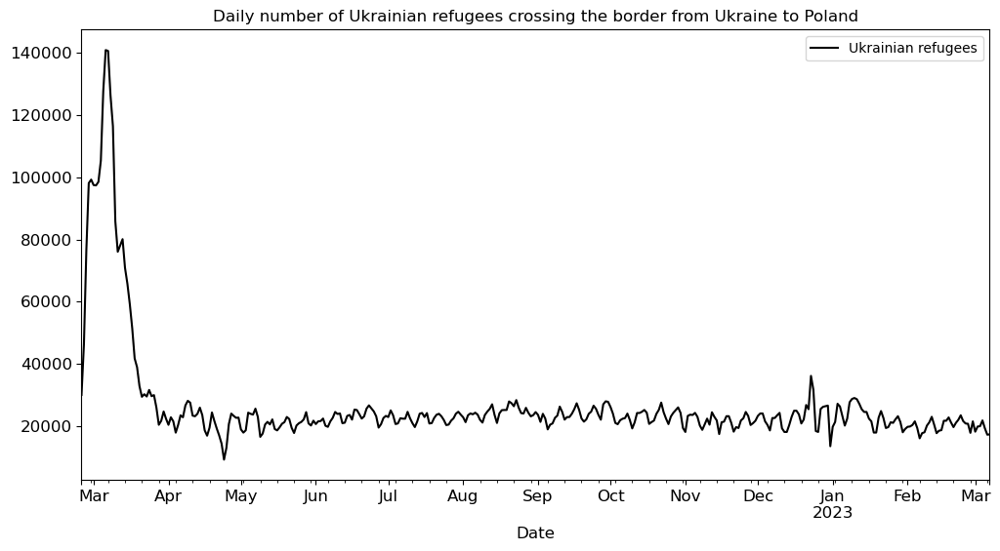

In [7]:
plot_timeseries(df_official, 
                color=colors_langs_dict, 
                title="Daily number of Ukrainian refugees crossing the border from Ukraine to Poland", 
                note="UNHCR-data")

## DANE data

In [8]:
df_dane = pd.read_csv("data/data_dane_applications_cities_pol_week.csv", index_col=0)
df_dane.rename(columns={"WARSZAWA": "WARSAW"}, inplace=True)
df_dane

,BIAŁYSTOK,BYDGOSZCZ,CZĘSTOCHOWA,GDAŃSK,GDYNIA,GLIWICE,KATOWICE,KIELCE,KRAKÓW,LUBLIN,POZNAŃ,RADOM,RZESZÓW,SOSNOWIEC,SZCZECIN,TORUŃ,WARSAW,WROCŁAW,ŁÓDŹ
date,,,,,,,,,,,,,,,,,,,
2022-04-17,3063.0,8037.00,3548.0,10256.0,6821.0,4079.0,8909.00,3145.00,16925.0,6083.0,21989.0,2035.0,5972.00,3480.00,8647.00,3983.0,81562.00,25416.0,9687.0
2022-04-24,151.0,462.00,254.0,1738.0,775.0,230.0,551.00,162.00,2359.0,728.0,3008.0,82.0,252.00,318.00,1315.00,275.0,7686.00,3943.0,1117.0
2022-05-01,50.0,144.00,108.0,951.0,325.0,98.0,279.00,63.00,1624.0,244.0,583.0,47.0,101.00,203.00,417.00,101.0,3772.00,2173.0,508.0
2022-05-08,165.0,358.00,297.0,2058.0,488.0,215.0,648.00,132.00,2861.0,574.0,1179.0,98.0,350.00,207.00,956.00,164.0,6615.00,5256.0,1128.0
2022-05-15,65.0,224.00,173.0,874.0,259.0,111.0,325.00,97.00,1482.0,349.0,725.0,94.0,192.00,113.00,477.00,141.0,4115.00,1330.0,549.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-30,-11.0,-36.25,-19.5,-16.0,-33.0,-23.0,-28.75,-16.25,-43.5,4.5,-113.5,-8.0,18.25,2.75,-56.25,-22.5,-285.75,9.0,-67.5
2023-08-06,-11.0,-36.25,-19.5,-16.0,-33.0,-23.0,-28.75,-16.25,-43.5,4.5,-113.5,-8.0,18.25,2.75,-56.25,-22.5,-285.75,9.0,-67.5
2023-08-13,-48.0,-88.00,-32.0,-103.0,-65.0,-41.0,-50.00,-19.00,-206.0,-53.0,-256.0,-14.0,-63.00,-41.00,-102.00,-44.0,-611.00,2.0,-152.0


In [9]:
df_dane_stocks = pd.read_csv("data/data_dane_applications_cities_pol_week_stocks.csv", index_col=0)
df_dane_stocks.rename(columns={"WARSZAWA": "WARSAW"}, inplace=True)
df_dane_stocks

,BIAŁYSTOK,BYDGOSZCZ,CZĘSTOCHOWA,GDAŃSK,GDYNIA,GLIWICE,KATOWICE,KIELCE,KRAKÓW,LUBLIN,POZNAŃ,RADOM,RZESZÓW,SOSNOWIEC,SZCZECIN,TORUŃ,WARSAW,WROCŁAW,ŁÓDŹ
date,,,,,,,,,,,,,,,,,,,
2022-04-17,3063.0,8037.00,3548.0,10256.0,6821.0,4079.0,8909.00,3145.00,16925.0,6083.0,21989.0,2035.0,5972.00,3480.00,8647.00,3983.0,81562.00,25416.0,9687.0
2022-04-24,3214.0,8499.00,3802.0,11994.0,7596.0,4309.0,9460.00,3307.00,19284.0,6811.0,24997.0,2117.0,6224.00,3798.00,9962.00,4258.0,89248.00,29359.0,10804.0
2022-05-01,3264.0,8643.00,3910.0,12945.0,7921.0,4407.0,9739.00,3370.00,20908.0,7055.0,25580.0,2164.0,6325.00,4001.00,10379.00,4359.0,93020.00,31532.0,11312.0
2022-05-08,3429.0,9001.00,4207.0,15003.0,8409.0,4622.0,10387.00,3502.00,23769.0,7629.0,26759.0,2262.0,6675.00,4208.00,11335.00,4523.0,99635.00,36788.0,12440.0
2022-05-15,3494.0,9225.00,4380.0,15877.0,8668.0,4733.0,10712.00,3599.00,25251.0,7978.0,27484.0,2356.0,6867.00,4321.00,11812.00,4664.0,103750.00,38118.0,12989.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-30,3294.0,9232.25,4780.5,17325.0,8725.0,5136.0,10976.75,3637.25,32115.5,9053.5,24915.5,2685.0,7019.75,4855.25,14116.25,4151.5,104632.75,45960.0,16136.5
2023-08-06,3283.0,9196.00,4761.0,17309.0,8692.0,5113.0,10948.00,3621.00,32072.0,9058.0,24802.0,2677.0,7038.00,4858.00,14060.00,4129.0,104347.00,45969.0,16069.0
2023-08-13,3235.0,9108.00,4729.0,17206.0,8627.0,5072.0,10898.00,3602.00,31866.0,9005.0,24546.0,2663.0,6975.00,4817.00,13958.00,4085.0,103736.00,45971.0,15917.0


In [10]:
rank_PESEL = pd.DataFrame.from_dict(dict([(c[0].replace(" DANE", ""), c[1])
                                                 for c in sorted(dict(df_dane_stocks.max()).items(), key=lambda x:x[1], reverse=True)]), 
                                           orient="index")
rank_PESEL.columns = ["Max PESEL stocks"]
rank_PESEL.index = [c.capitalize() for c in rank_PESEL.index]
rank_PESEL

,Max PESEL stocks
Warsaw,141391.0
Wrocław,55320.0
Kraków,39306.0
Poznań,34998.0
Gdańsk,21361.0
Łódź,19717.0
Szczecin,17087.0
Katowice,14641.0
Lublin,12138.0
Bydgoszcz,11920.0


## Wikipedia data
For each Polish city, we collected the data on the number of views on Wikipedia pages using the Wikimedia pageviews platform: https://pageviews.wmcloud.org/langviews/


### Biggest Polish cities

https://metropolie.pl/fileadmin/news/2022/07/Urban_hospitality_update.pdf
https://businessinsider-com-pl.translate.goog/wiadomosci/wiemy-do-ktorych-miast-dotarlo-najwiecej-uchodzcow-z-ukrainy/1cqkwe5?_x_tr_sl=pl&_x_tr_tl=en&_x_tr_hl=pl&_x_tr_pto=wapp

In [11]:
# Country + Polish cities with more than 200k inhabitants
polish_cities = ["Poland",
                 "Białystok", 
                 "Bydgoszcz", 
                 "Częstochowa", 
                 "Gdańsk", 
                 "Gdynia", 
                 "Gliwice", 
                 "Katowice", 
                 "Kielce", 
                 "Kraków", 
                 "Łódź", 
                 "Lublin", 
                 "Poznań", 
                 "Radom", 
                 "Sosnowiec", 
                 "Szczecin",
                 "Toruń",
                 "Warsaw", 
                 "Wrocław"] 

In [12]:
# use glob to get all the csv files in the folder
path = os.getcwd()
csv_files_preprocess = glob.glob(os.path.join(path, "data/data_wikipedia_views_cities_pol/*.csv"))
csv_files_preprocess = list(set(csv_files_preprocess))

In [13]:
len(csv_files_preprocess)

20

In [14]:
language_codes = pd.read_csv("data/language-codes-full.csv")
language_codes = language_codes[["alpha3-b", "alpha2", "English"]]

language_codes

,alpha3-b,alpha2,English
0,aar,aa,Afar
1,abk,ab,Abkhazian
2,ace,NaN,Achinese
3,ach,NaN,Acoli
4,ada,NaN,Adangme
...,...,...,...
482,znd,NaN,Zande languages
483,zul,zu,Zulu
484,zun,NaN,Zuni
485,zxx,NaN,No linguistic content; Not applicable


In [15]:
def timeseries_relative_change(csv_files_preprocess, same_scale=False):
    colors = ["#1b9e77", "#d95f02", "#7570b3", "#e7298a", "#66a61e", "#e6ab02", "#a6761d", "#666666"]
    colors = [mplcolor.to_hex(c) for c in sns.color_palette("tab10")]
    remaining_colors = ['#d95f02', '#d95f02', '#d95f02', '#d95f02', '#d95f02', '#d95f02', '#7570b3', '#1f78b4', '#e31a1c']

    #sns.set(rc={'figure.figsize':(20, 10)})
    plt.rcParams["figure.figsize"] = (5, 5)
    plt.rcParams['legend.fontsize'] = 14
    
    deltas_wiki_views = dict()
    diff_median = dict()

    for f in csv_files_preprocess:
        city_wikipedia = f.split("\\")[-1].split(".")[0]
        city = f.split("\\")[-1].split(".")[0].replace(",", " ")  

        colors_langs_dict = {"English": "#666666", 
                             "Ukrainian": "#e7298a",
                             "Russian": "#1b9e77"}

        df = pd.read_csv(f, low_memory=False)
        
        df.drop(columns = ["Title", "Badges"], inplace=True)
        
        df = df.merge(language_codes[["alpha2", "English"]], how="left", left_on="Language", right_on="alpha2").merge(language_codes[["alpha3-b", "English"]], how="left", left_on=["Language", "English"], right_on=["alpha3-b", "English"])
        df["Wikipedia Page Language"] = df["English"]
        df.drop(columns="English", inplace=True)
        df["Wikipedia Page Language"].fillna(df["Language"], inplace=True)
        df.drop(columns=["Language", "alpha2", "alpha3-b"], inplace=True)
        df.set_index("Wikipedia Page Language", inplace=True)
        
        official_langs = ["Polish"]
        for i, l in enumerate(official_langs):
            if l not in colors_langs_dict.keys():
                colors_langs_dict[l] = remaining_colors[i]

        languages = colors_langs_dict.keys() 
        languages = [l for l in languages if l in df.index]

        df_weekly = df.T.reset_index()
        df_weekly = df_weekly.assign(Weeks = df_weekly['index']).drop(columns = 'index')
        df_weekly['Weeks'] =  df_weekly['Weeks'].astype('datetime64[ns]')
        df_weekly = df_weekly.resample('W-Mon', label='left', closed = 'left', on='Weeks').sum()

        df = df_weekly.T

        df = df.loc[languages]

        df_plot = df
        df_plot.columns = df_plot.columns.astype('datetime64[ns]')
        df_plot = df_plot.T

        #Baseline + Pre-post war period
        df_plot = df_plot[(df_plot.index >= "2020-02-24") & (df_plot.index <= "2023-08-24")]

        #Assuming the period until 2018 as a baseline period, we calculate the relative change!
        df_plot_baseline = df_plot[df_plot.index < "2020-08-24"]
        dict_language_baseline = dict(df_plot_baseline.median())
        print("MEDIAN VIEWS BASELINE 24.02-24.08.2020:", dict_language_baseline)
        
        #in case baseline is 0 (no views at all)
        for k,v in dict_language_baseline.items():
            if v == 0:
                dict_language_baseline[k] = 1

        dict_language_median_pre = dict(df_plot[(df_plot.index >= "2020-08-24") & (df_plot.index < "2022-02-24")].median())
        print("MEDIAN VIEWS PRE WAR 24.02.2022:       ", dict_language_median_pre)
        dict_language_median_post = dict(df_plot[(df_plot.index > "2022-02-24")].median())
        print("MEDIAN VIEWS POST WAR 24.02.2022:      ", dict_language_median_post)


        df_plot_proportion = df_plot[df_plot.index >= "2020-08-24"]
        df_plot_proportion = (df_plot_proportion-dict_language_baseline)/dict_language_baseline*100

        axes = df_plot_proportion.plot.line(subplots=True, color=colors_langs_dict, lw=2)

        axes = axes.flat  # .ravel() and .flatten() also work
        # extract the figure object to use figure level methods
        fig = axes[0].get_figure()

        fig.suptitle(city_wikipedia + " - Relative change in the number of views\nBaseline period: 24.02.2020-24.08.2020", fontsize=14)

        # iterate through each axes to use axes level methods
        for ax in axes:
            ax.legend(handletextpad=-2.0, handlelength=0, loc='upper left', bbox_to_anchor=(0.08, 1.1), frameon=False)
            ax.vlines(x="2022-02-24", 
                   ymin=int(min(df_plot_proportion.min())), 
                   ymax=int(max(df_plot_proportion.max())), linestyles="dashed", color="gray")

        plt.savefig("figs/series/relative-change-views-" + city + ".png", format="png", bbox_inches="tight", dpi=300)
        plt.show()


        views_post_war = df_plot_proportion[df_plot_proportion.index > "2022-02-24"].sum()
        views_pre_war = df_plot_proportion[df_plot_proportion.index < "2022-02-24"].sum()

        deltas_wiki_views[city] = dict(views_post_war - views_pre_war)
        diff_median[city] = dict()
        for k, v in dict_language_median_post.items():
            diff_median[city][k] = v - dict_language_median_pre.get(k, 0)

    return deltas_wiki_views, diff_median

In [16]:
len(csv_files_preprocess)

20

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 2222.5, 'Ukrainian': 202.0, 'Russian': 852.5, 'Polish': 5549.5}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 2260.0, 'Ukrainian': 251.0, 'Russian': 964.0, 'Polish': 5400.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 2799.0, 'Ukrainian': 673.5, 'Russian': 1618.0, 'Polish': 4549.0}


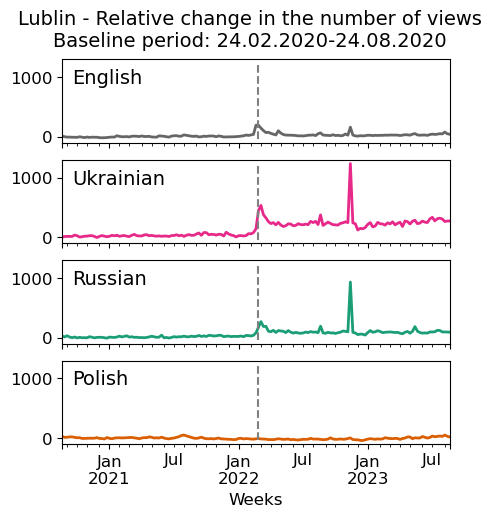

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 2029.0, 'Ukrainian': 148.0, 'Russian': 664.5, 'Polish': 5151.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 1950.0, 'Ukrainian': 198.0, 'Russian': 874.0, 'Polish': 5067.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 2270.5, 'Ukrainian': 468.0, 'Russian': 1286.5, 'Polish': 5283.0}


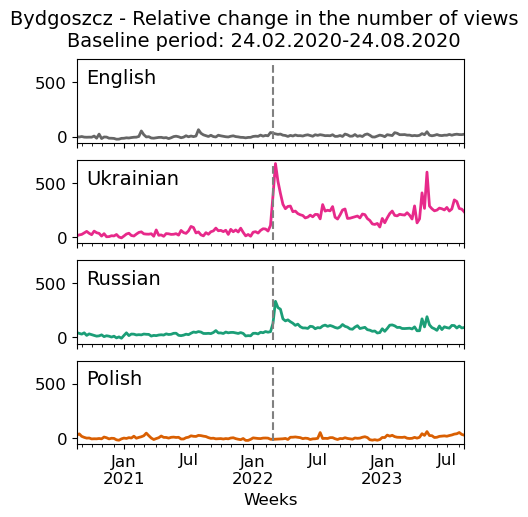

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 1283.5, 'Ukrainian': 180.5, 'Russian': 399.5, 'Polish': 4343.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 1355.0, 'Ukrainian': 213.0, 'Russian': 486.0, 'Polish': 4322.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 2322.5, 'Ukrainian': 830.0, 'Russian': 1551.5, 'Polish': 4635.0}


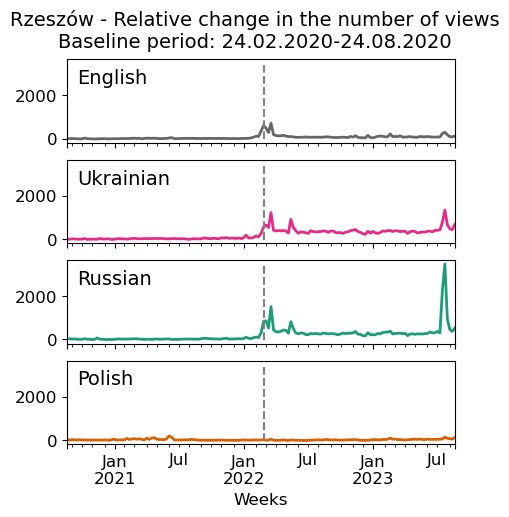

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 1159.0, 'Ukrainian': 126.5, 'Russian': 506.5, 'Polish': 3627.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 1280.0, 'Ukrainian': 176.0, 'Russian': 622.0, 'Polish': 3307.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 1658.0, 'Ukrainian': 407.0, 'Russian': 1007.0, 'Polish': 3448.5}


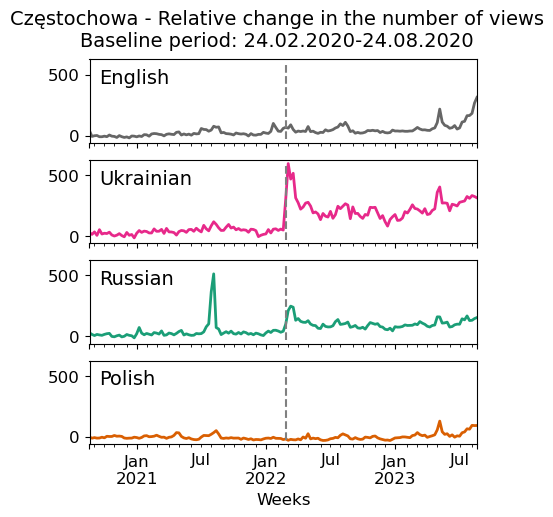

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 3996.0, 'Ukrainian': 258.5, 'Russian': 1565.5, 'Polish': 5584.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 3892.0, 'Ukrainian': 305.0, 'Russian': 1738.0, 'Polish': 5347.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 4670.0, 'Ukrainian': 635.5, 'Russian': 2604.5, 'Polish': 5476.0}


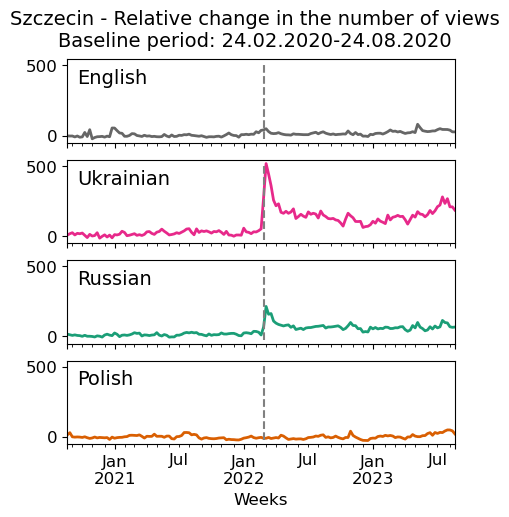

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 3920.5, 'Ukrainian': 251.5, 'Russian': 1474.5, 'Polish': 6983.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 4242.0, 'Ukrainian': 363.0, 'Russian': 1923.0, 'Polish': 7163.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 5048.0, 'Ukrainian': 712.5, 'Russian': 2528.0, 'Polish': 7638.0}


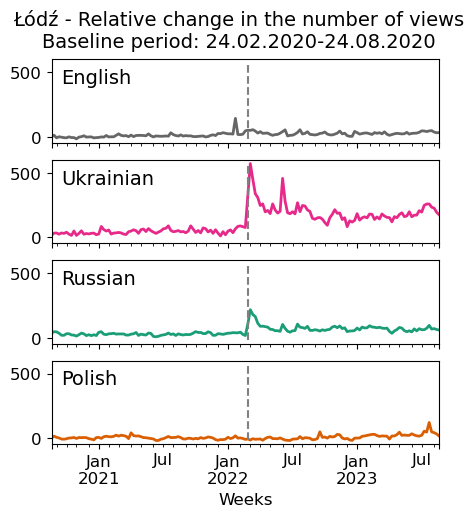

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 804.5, 'Ukrainian': 66.0, 'Russian': 218.0, 'Polish': 3532.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 817.0, 'Ukrainian': 79.0, 'Russian': 252.0, 'Polish': 3344.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 904.0, 'Ukrainian': 181.5, 'Russian': 469.5, 'Polish': 3132.0}


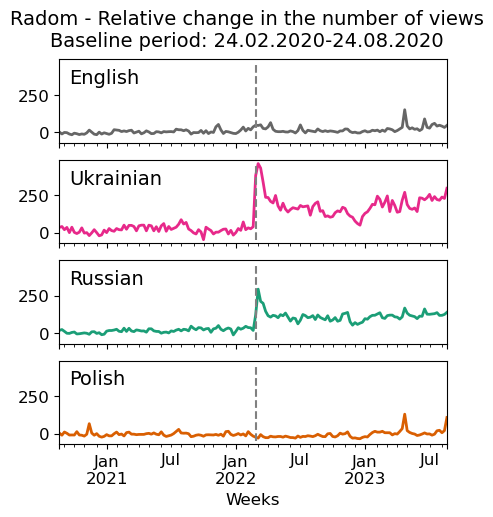

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 56786.0, 'Ukrainian': 3236.0, 'Russian': 15023.0, 'Polish': 47477.5}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 66510.0, 'Ukrainian': 4019.0, 'Russian': 17035.0, 'Polish': 50037.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 76545.0, 'Ukrainian': 6150.0, 'Russian': 24265.0, 'Polish': 45714.5}


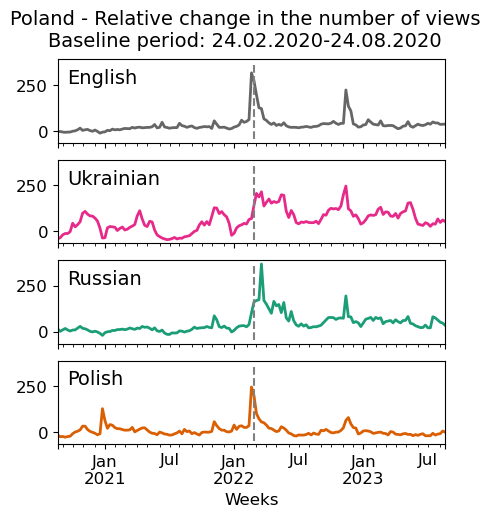

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 497.5, 'Ukrainian': 55.5, 'Russian': 209.5, 'Polish': 2442.5}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 538.0, 'Ukrainian': 69.0, 'Russian': 239.0, 'Polish': 2166.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 581.5, 'Ukrainian': 107.0, 'Russian': 333.0, 'Polish': 2107.0}


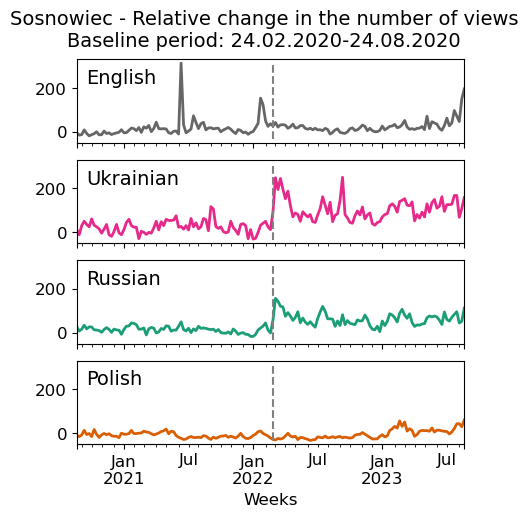

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 10039.5, 'Ukrainian': 445.5, 'Russian': 2489.0, 'Polish': 12096.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 9619.0, 'Ukrainian': 555.0, 'Russian': 2911.0, 'Polish': 10652.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 13471.0, 'Ukrainian': 1503.5, 'Russian': 4508.0, 'Polish': 10175.5}


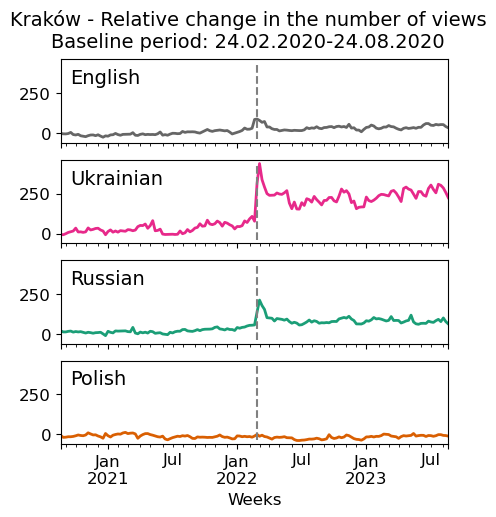

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 2254.0, 'Ukrainian': 95.5, 'Russian': 1336.0, 'Polish': 4951.5}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 2346.0, 'Ukrainian': 123.0, 'Russian': 1530.0, 'Polish': 4637.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 2776.5, 'Ukrainian': 269.0, 'Russian': 2489.0, 'Polish': 3985.5}


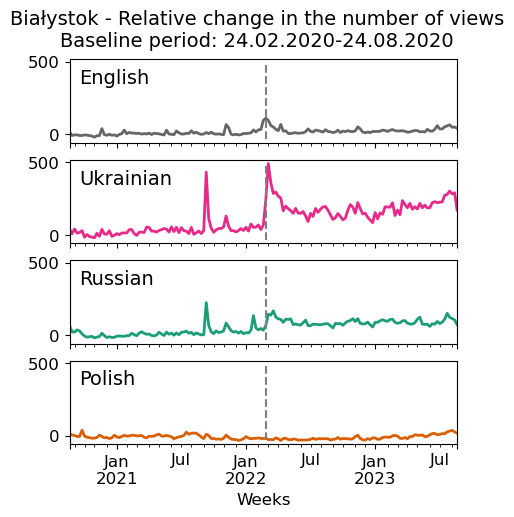

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 1843.5, 'Ukrainian': 102.0, 'Russian': 557.5, 'Polish': 5023.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 1845.0, 'Ukrainian': 128.0, 'Russian': 669.0, 'Polish': 4499.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 2224.0, 'Ukrainian': 279.0, 'Russian': 1040.5, 'Polish': 4440.0}


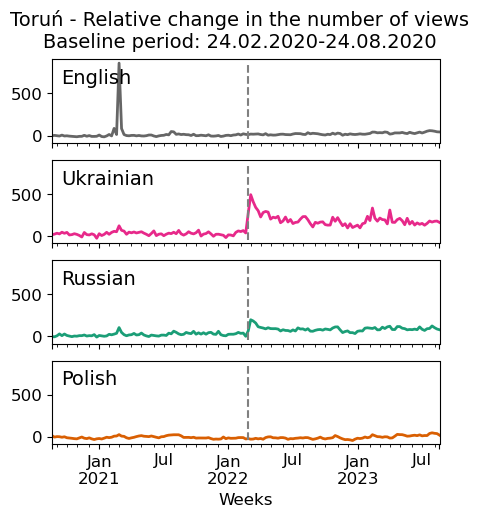

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 7660.5, 'Ukrainian': 354.0, 'Russian': 2563.0, 'Polish': 8115.5}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 7966.0, 'Ukrainian': 440.0, 'Russian': 2997.0, 'Polish': 7244.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 10196.0, 'Ukrainian': 1060.0, 'Russian': 4314.5, 'Polish': 7064.0}


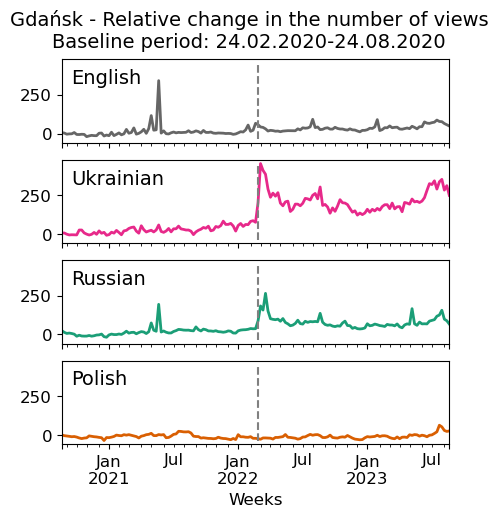

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 2701.0, 'Ukrainian': 150.0, 'Russian': 913.0, 'Polish': 4943.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 2942.0, 'Ukrainian': 226.0, 'Russian': 1186.0, 'Polish': 5071.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 3992.5, 'Ukrainian': 696.0, 'Russian': 2141.5, 'Polish': 5321.0}


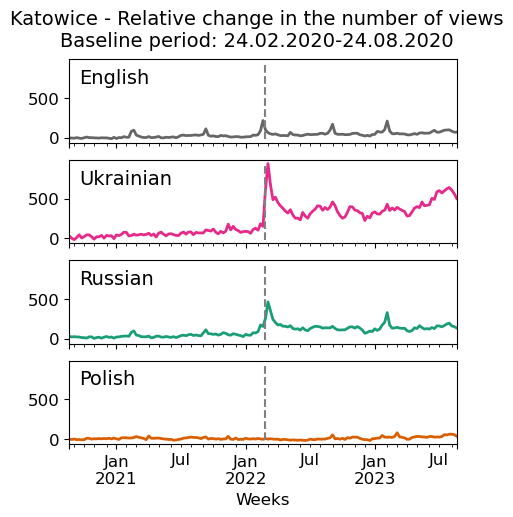

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 7750.5, 'Ukrainian': 485.0, 'Russian': 2444.0, 'Polish': 10462.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 8059.0, 'Ukrainian': 692.0, 'Russian': 3322.0, 'Polish': 9837.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 10425.5, 'Ukrainian': 1323.0, 'Russian': 4559.0, 'Polish': 9711.5}


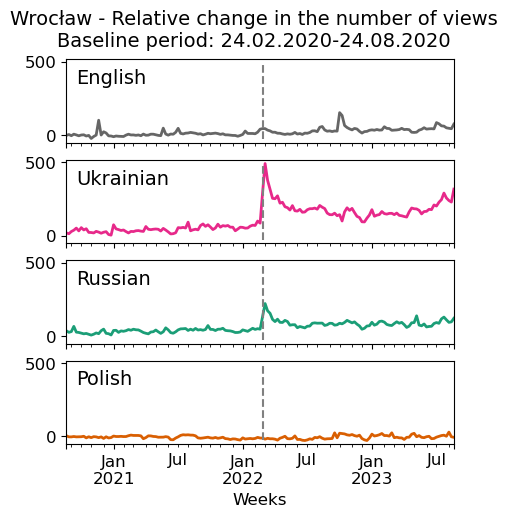

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 4477.0, 'Ukrainian': 256.0, 'Russian': 1439.5, 'Polish': 7494.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 4494.0, 'Ukrainian': 391.0, 'Russian': 1829.0, 'Polish': 7181.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 5782.5, 'Ukrainian': 783.5, 'Russian': 2603.5, 'Polish': 6913.5}


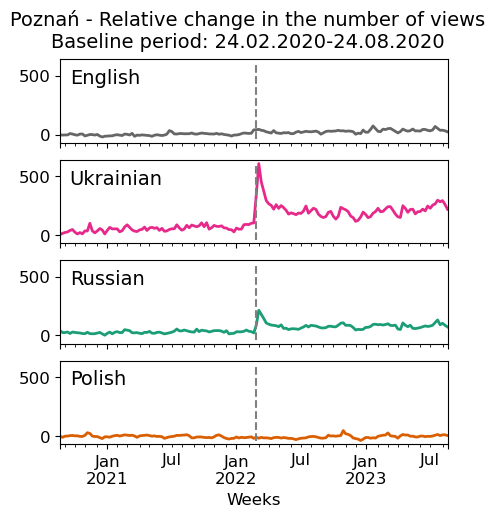

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 1294.0, 'Ukrainian': 0.0, 'Russian': 327.0, 'Polish': 2322.5}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 1242.0, 'Ukrainian': 99.0, 'Russian': 442.0, 'Polish': 2459.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 1170.5, 'Ukrainian': 222.5, 'Russian': 661.0, 'Polish': 2651.5}


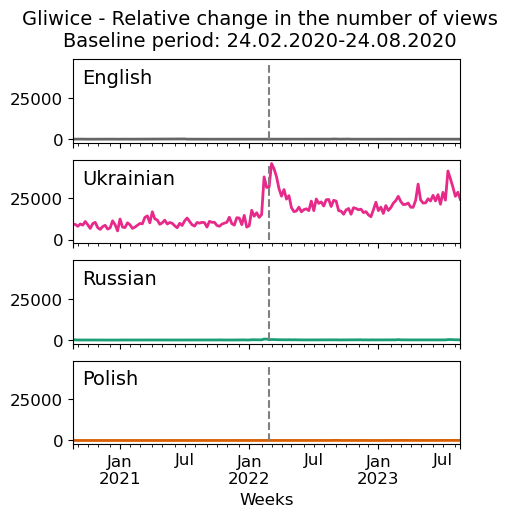

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 854.5, 'Ukrainian': 19.0, 'Russian': 338.0, 'Polish': 3465.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 907.0, 'Ukrainian': 92.0, 'Russian': 382.0, 'Polish': 3383.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 1105.0, 'Ukrainian': 222.0, 'Russian': 616.0, 'Polish': 3304.5}


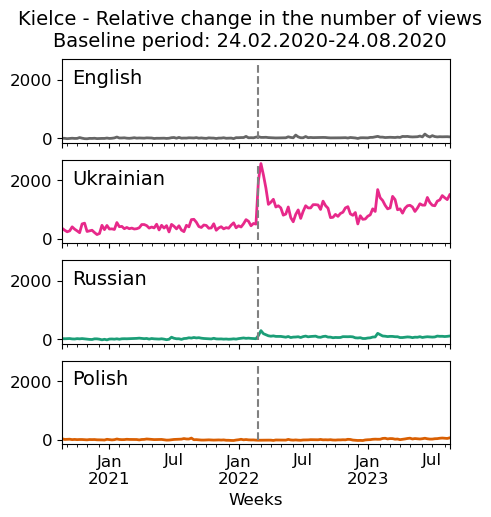

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 15417.5, 'Ukrainian': 571.5, 'Russian': 3706.5, 'Polish': 21957.5}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 16422.0, 'Ukrainian': 714.0, 'Russian': 4260.0, 'Polish': 20818.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 20451.5, 'Ukrainian': 1731.0, 'Russian': 6751.0, 'Polish': 20821.0}


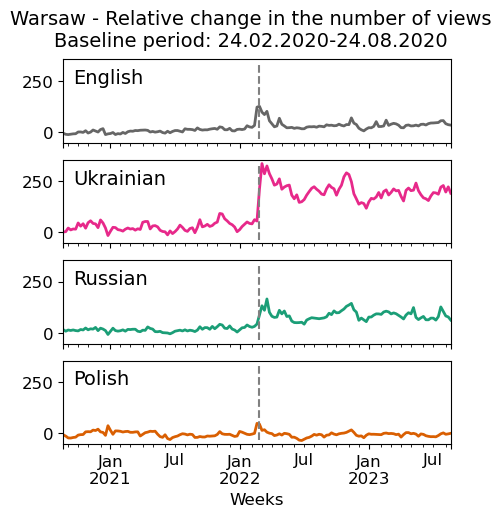

MEDIAN VIEWS BASELINE 24.02-24.08.2020: {'English': 1864.5, 'Ukrainian': 81.5, 'Russian': 490.0, 'Polish': 4318.0}
MEDIAN VIEWS PRE WAR 24.02.2022:        {'English': 1717.0, 'Ukrainian': 101.0, 'Russian': 513.0, 'Polish': 3633.0}
MEDIAN VIEWS POST WAR 24.02.2022:       {'English': 2077.5, 'Ukrainian': 300.5, 'Russian': 779.0, 'Polish': 3670.0}


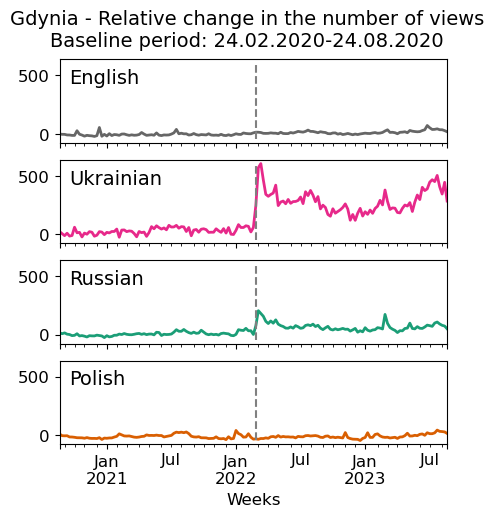

In [17]:
deltas_wiki_views, diffs_median = timeseries_relative_change(csv_files_preprocess, same_scale=True)

In [18]:
plt.rcParams['axes.spines.left'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.bottom'] = False
plt.rcParams["figure.figsize"] = (8, 6.5)

In [19]:
def plot_ranking(ranking_1, ranking_2, language="Ukrainian"):
    
    pallet1 = ['#8dd3c7', '#ffffb3', '#bebada', '#fb8072', '#80b1d3', '#fdb462', '#b3de69', '#fccde5', '#d9d9d9', '#bc80bd']
    pallet2 = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c', '#fdbf6f', '#ff7f00', '#cab2d6', '#6a3d9a']
    pallet3 = ['#a50026', '#d73027', '#f46d43', '#fdae61', '#fee090', '#e0f3f8', '#abd9e9', '#74add1', '#4575b4', '#313695']
    pallet4 = ['#6f0000', '#7f0000', '#8f0000', '#9f0000', '#af0000', '#bf0000', '#cf0000', '#df0000', '#ef0000', '#ff0000']
    pallet_mpidr = ['#005869', '#ef7b00', '#8e203c', '#3e2c51', '#22b472', '#faae3b', '#0e7aac']
    pallet_mpi_reds = ['#8e203c', '#c0272c', '#d8361a', '#ef7b00', '#faae3b']
    greys = ['#808080']*10
    
    ranking_1_int = dict()
    for i, location in enumerate(ranking_1):
        ranking_1_int[location] = len(ranking_1) - i
    
    ranks = dict()
    for location in ranking_1:
        ranks[location] = [ranking_1_int[location]]

    for i, location in enumerate(ranking_2):
        ranks[location] += [len(ranking_2) - i] 

    tableau20 = pallet_mpi_reds + greys + greys 
    
    # Avoid unnecessary whitespace.    
    plt.ylim(0, 16)    
    plt.xlim(1, 1.5)    

    # Make sure your axis ticks are large enough to be easily read.    
    # You don't want your viewers squinting to read your plot. 
    y_ticks_label, y_ticks = zip(*sorted(ranking_1_int.items(), key=lambda kv:kv[1]))
    plt.yticks(y_ticks, y_ticks_label, fontsize=18)    
    plt.xticks([1,1.5], ["PESEL stocks", 
                        "Delta median relative change \n " + language + " Wikipedia views"], fontsize=18)    
        
    # Remove the tick marks; they are unnecessary with the tick lines we just plotted.    
    plt.tick_params(axis="both", which="both", bottom="off", top="off",    
                    labelbottom="on", left="off", right="off", labelleft="on")    
    
    locations = ranking_1

    for i, location in enumerate(ranking_1):    
        if i < 10: 
            plt.plot([1,1.5], ranks[location], lw=4, color=tableau20[i])    
        else:
            plt.plot([1,1.5], ranks[location], lw=2, color=tableau20[i]) 

        # Add a text label to the right end of every line. Most of the code below    
        # is adding specific offsets y position because some labels overlapped.    
        y_pos = ranks[location][1]

        plt.text(1.55, y_pos, location, fontsize=18, color=tableau20[i])    
    plt.tight_layout()
    plt.savefig("figs/ranks/rank_polish_cities_" + language + ".png", bbox_inches="tight", format="png", dpi=300)
    plt.show()

Ukrainian
Delta sum -0.1280701754385965 0.6013177937232191
Delta median 0.8684210526315789 1.4290128393433576e-06


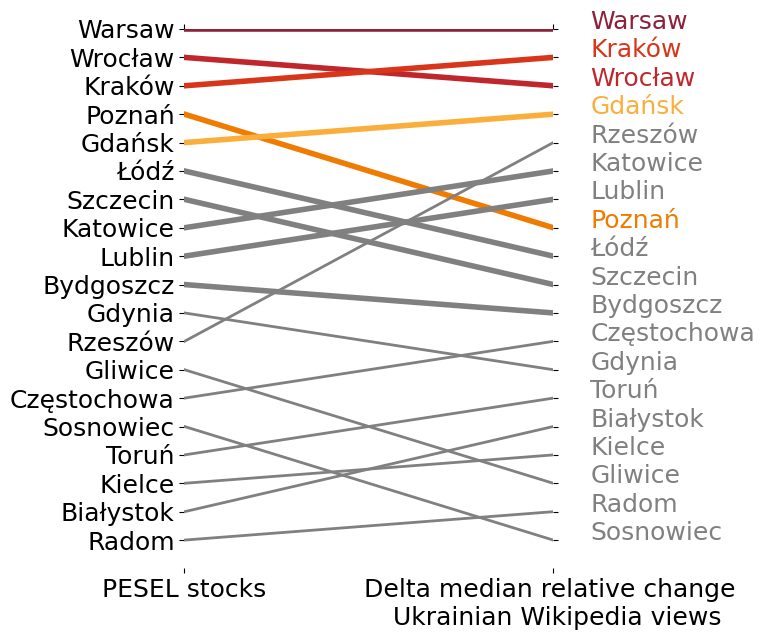

Russian
Delta sum -0.3473684210526316 0.1450660569776148
Delta median 0.7245614035087719 0.0004501976283496307


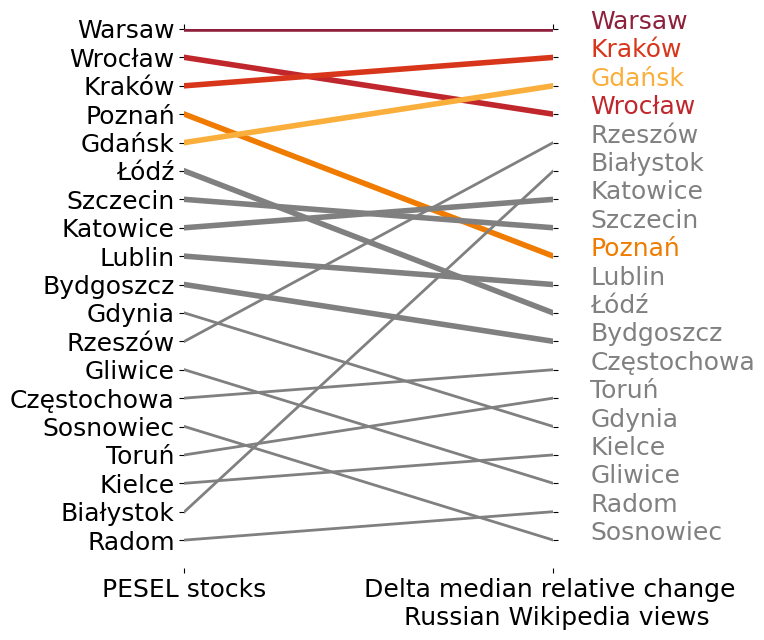

English
Delta sum 0.37894736842105264 0.10959964442893559
Delta median 0.8315789473684211 1.0211881664518575e-05


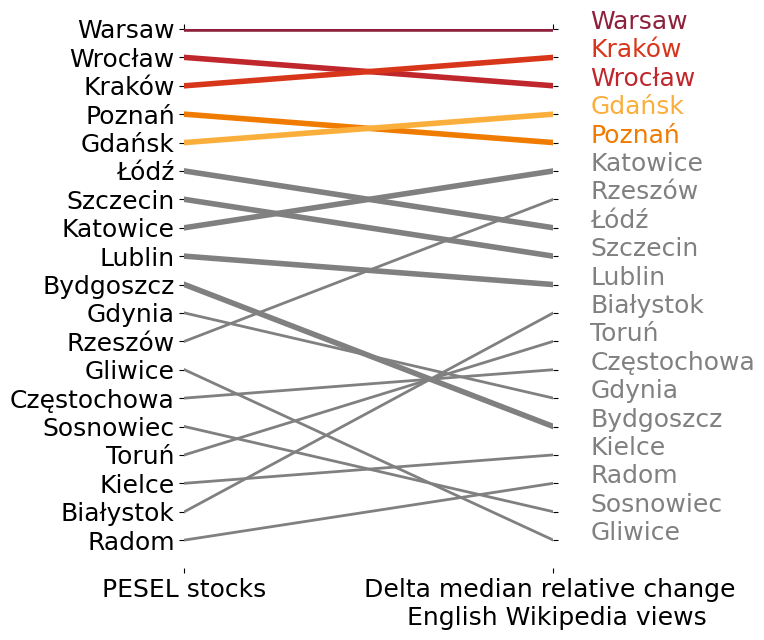

Polish
Delta sum -0.2543859649122807 0.29326785559945445
Delta median 0.016673981420877365 0.9459844228908771


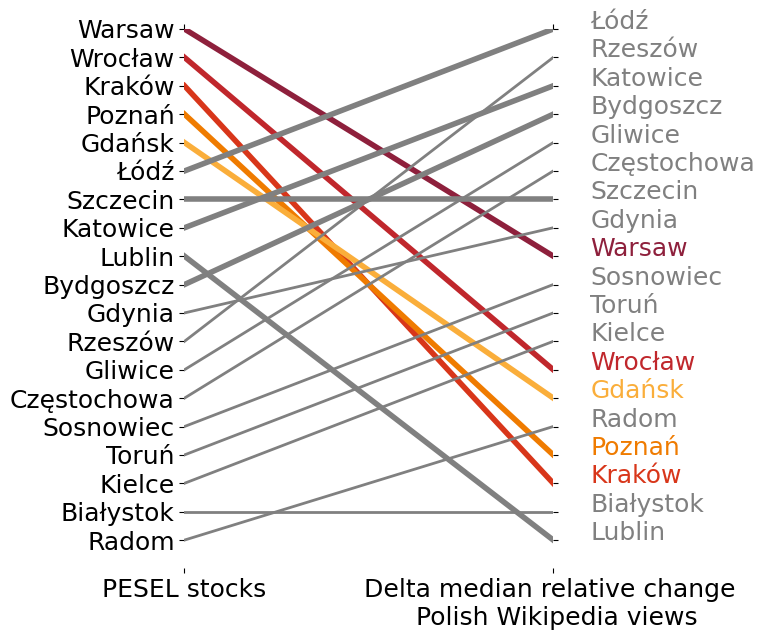

In [20]:
for language in ["Ukrainian", "Russian", "English", "Polish"]:
    rank_wiki_deltas = pd.DataFrame.from_dict(dict([(c[0], c[1][language]) 
                                                for c in sorted(deltas_wiki_views.items(), 
                                                                key=lambda x:x[1][language], reverse=True) 
                                                if c[0] != 'Poland']), orient="index")
    rank_wiki_deltas.columns = ["Delta sum relative change"]

    rank_wiki_medians = pd.DataFrame.from_dict(dict([(c[0], c[1][language]) 
                                                for c in sorted(diffs_median.items(), 
                                                                key=lambda x:x[1][language], reverse=True) 
                                                if c[0] != 'Poland']), orient="index")
    rank_wiki_medians.columns = ["Delta median relative change"]
    
    ranks = rank_PESEL.merge(rank_wiki_deltas, right_index=True, left_index=True)
    ranks = ranks.merge(rank_wiki_medians, right_index=True, left_index=True)
    
    print(language)
    rho, p = spearmanr(ranks["Max PESEL stocks"], ranks["Delta sum relative change"])
    print("Delta sum", rho, p)
    
    rho, p = spearmanr(ranks["Max PESEL stocks"], ranks["Delta median relative change"])
    print("Delta median", rho, p)
    
    plot_ranking(ranks["Max PESEL stocks"].sort_values(ascending=False).index.tolist(), 
                 ranks["Delta median relative change"].sort_values(ascending=False).index.tolist(),
                 language)

In [21]:
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.right'] = True
plt.rcParams['axes.spines.top'] = True
plt.rcParams['axes.spines.bottom'] = True
plt.rcParams["figure.figsize"] = (8, 6.5)

### PESEL

In [22]:
df_dane.drop(index=df_dane.index[0], axis=0, inplace=True)
df_dane

,BIAŁYSTOK,BYDGOSZCZ,CZĘSTOCHOWA,GDAŃSK,GDYNIA,GLIWICE,KATOWICE,KIELCE,KRAKÓW,LUBLIN,POZNAŃ,RADOM,RZESZÓW,SOSNOWIEC,SZCZECIN,TORUŃ,WARSAW,WROCŁAW,ŁÓDŹ
date,,,,,,,,,,,,,,,,,,,
2022-04-24,151.0,462.00,254.0,1738.0,775.0,230.0,551.00,162.00,2359.0,728.0,3008.0,82.0,252.00,318.00,1315.00,275.0,7686.00,3943.0,1117.0
2022-05-01,50.0,144.00,108.0,951.0,325.0,98.0,279.00,63.00,1624.0,244.0,583.0,47.0,101.00,203.00,417.00,101.0,3772.00,2173.0,508.0
2022-05-08,165.0,358.00,297.0,2058.0,488.0,215.0,648.00,132.00,2861.0,574.0,1179.0,98.0,350.00,207.00,956.00,164.0,6615.00,5256.0,1128.0
2022-05-15,65.0,224.00,173.0,874.0,259.0,111.0,325.00,97.00,1482.0,349.0,725.0,94.0,192.00,113.00,477.00,141.0,4115.00,1330.0,549.0
2022-05-22,58.0,188.00,128.0,433.0,223.0,103.0,261.00,65.00,1194.0,299.0,559.0,67.0,156.00,75.00,403.00,85.0,2488.00,1183.0,455.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-30,-11.0,-36.25,-19.5,-16.0,-33.0,-23.0,-28.75,-16.25,-43.5,4.5,-113.5,-8.0,18.25,2.75,-56.25,-22.5,-285.75,9.0,-67.5
2023-08-06,-11.0,-36.25,-19.5,-16.0,-33.0,-23.0,-28.75,-16.25,-43.5,4.5,-113.5,-8.0,18.25,2.75,-56.25,-22.5,-285.75,9.0,-67.5
2023-08-13,-48.0,-88.00,-32.0,-103.0,-65.0,-41.0,-50.00,-19.00,-206.0,-53.0,-256.0,-14.0,-63.00,-41.00,-102.00,-44.0,-611.00,2.0,-152.0


In [23]:
df_dane.columns = [c.capitalize() + " DANE" for c in df_dane.columns]
df_dane["Date"] = df_dane.index.astype('datetime64[ns]')
df_dane.set_index("Date", inplace=True, drop=True) 
df_dane

,Białystok DANE,Bydgoszcz DANE,Częstochowa DANE,Gdańsk DANE,Gdynia DANE,Gliwice DANE,Katowice DANE,Kielce DANE,Kraków DANE,Lublin DANE,Poznań DANE,Radom DANE,Rzeszów DANE,Sosnowiec DANE,Szczecin DANE,Toruń DANE,Warsaw DANE,Wrocław DANE,Łódź DANE
Date,,,,,,,,,,,,,,,,,,,
2022-04-24,151.0,462.00,254.0,1738.0,775.0,230.0,551.00,162.00,2359.0,728.0,3008.0,82.0,252.00,318.00,1315.00,275.0,7686.00,3943.0,1117.0
2022-05-01,50.0,144.00,108.0,951.0,325.0,98.0,279.00,63.00,1624.0,244.0,583.0,47.0,101.00,203.00,417.00,101.0,3772.00,2173.0,508.0
2022-05-08,165.0,358.00,297.0,2058.0,488.0,215.0,648.00,132.00,2861.0,574.0,1179.0,98.0,350.00,207.00,956.00,164.0,6615.00,5256.0,1128.0
2022-05-15,65.0,224.00,173.0,874.0,259.0,111.0,325.00,97.00,1482.0,349.0,725.0,94.0,192.00,113.00,477.00,141.0,4115.00,1330.0,549.0
2022-05-22,58.0,188.00,128.0,433.0,223.0,103.0,261.00,65.00,1194.0,299.0,559.0,67.0,156.00,75.00,403.00,85.0,2488.00,1183.0,455.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-30,-11.0,-36.25,-19.5,-16.0,-33.0,-23.0,-28.75,-16.25,-43.5,4.5,-113.5,-8.0,18.25,2.75,-56.25,-22.5,-285.75,9.0,-67.5
2023-08-06,-11.0,-36.25,-19.5,-16.0,-33.0,-23.0,-28.75,-16.25,-43.5,4.5,-113.5,-8.0,18.25,2.75,-56.25,-22.5,-285.75,9.0,-67.5
2023-08-13,-48.0,-88.00,-32.0,-103.0,-65.0,-41.0,-50.00,-19.00,-206.0,-53.0,-256.0,-14.0,-63.00,-41.00,-102.00,-44.0,-611.00,2.0,-152.0


In [24]:
max(df_dane.max())

7686.0

## Merging datasets: 
## Wikipedia views in Polish cities and Ukrainian refugees crossing the border to Poland 

In [25]:
df_merged = df_official

for f in csv_files_preprocess:
    city = f.split("\\")[-1].split(".")[0]
    
    df = pd.read_csv(f, low_memory=False)
    df.drop(columns = ["Title", "Badges"], inplace=True)
    df = df[df["Language"].isin(colors_langs_dict.keys())]
    df.set_index("Language", inplace=True)

    df.columns = df.columns.astype('datetime64[ns]')
    df = df.T
    
    ## COMBINING DATASETS: UNHRC + WIKIPEDIA VIEWS (PL, EN, UK)
    df_merged = df_merged.merge(df.add_prefix(city + " "), how="right", left_index=True, right_index=True)

In [26]:
df_merged

,Ukrainian refugees,Lublin pl,Lublin en,Lublin ru,Lublin uk,Bydgoszcz pl,Bydgoszcz en,Bydgoszcz ru,Bydgoszcz uk,Rzeszów pl,...,Kielce ru,Kielce uk,Warsaw pl,Warsaw en,Warsaw ru,Warsaw uk,Gdynia pl,Gdynia en,Gdynia ru,Gdynia uk
2015-07-01,NaN,972.0,455.0,171.0,66.0,845.0,290.0,86.0,28.0,1348,...,46.0,0.0,2130.0,2012.0,490.0,80.0,539.0,246.0,80.0,7.0
2015-07-02,NaN,886.0,387.0,124.0,54.0,782.0,238.0,68.0,16.0,790,...,36.0,0.0,1940.0,2113.0,507.0,52.0,502.0,327.0,73.0,8.0
2015-07-03,NaN,984.0,259.0,100.0,46.0,743.0,248.0,60.0,19.0,788,...,44.0,0.0,1984.0,1840.0,425.0,65.0,545.0,316.0,79.0,8.0
2015-07-04,NaN,1427.0,335.0,114.0,54.0,1581.0,212.0,73.0,16.0,620,...,33.0,0.0,1772.0,1739.0,417.0,53.0,489.0,287.0,62.0,7.0
2015-07-05,NaN,1020.0,337.0,174.0,59.0,737.0,218.0,81.0,21.0,723,...,34.0,0.0,2066.0,1918.0,490.0,63.0,523.0,285.0,51.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-21,NaN,785.0,393.0,198.0,97.0,750.0,314.0,136.0,66.0,744,...,70.0,27.0,2580.0,2940.0,842.0,229.0,898.0,283.0,83.0,35.0
2023-10-22,NaN,912.0,410.0,217.0,88.0,897.0,300.0,157.0,77.0,968,...,77.0,27.0,2888.0,2963.0,860.0,276.0,817.0,318.0,70.0,27.0
2023-10-23,NaN,778.0,438.0,198.0,94.0,743.0,324.0,139.0,67.0,731,...,65.0,19.0,2670.0,3006.0,782.0,230.0,765.0,310.0,95.0,27.0
2023-10-24,NaN,688.0,405.0,207.0,94.0,820.0,306.0,167.0,46.0,664,...,76.0,22.0,2806.0,3031.0,856.0,227.0,791.0,296.0,84.0,40.0


In [27]:
df_merged.sum()

Ukrainian refugees    10045015.0
Lublin pl              2596399.0
Lublin en              1071055.0
Lublin ru               537654.0
Lublin uk               171363.0
                         ...    
Warsaw uk               391511.0
Gdynia pl              1799727.0
Gdynia en               874049.0
Gdynia ru               282569.0
Gdynia uk                62542.0
Length: 81, dtype: float64

In [28]:
df_merged_official = pd.DataFrame(df_merged["Ukrainian refugees"].dropna())
df_merged_official

,Ukrainian refugees
2022-02-24,30096.0
2022-02-25,46347.0
2022-02-26,76575.0
2022-02-27,98115.0
2022-02-28,99245.0
...,...
2023-03-03,20058.0
2023-03-04,21908.0
2023-03-05,19376.0
2023-03-06,17331.0


### Correlations

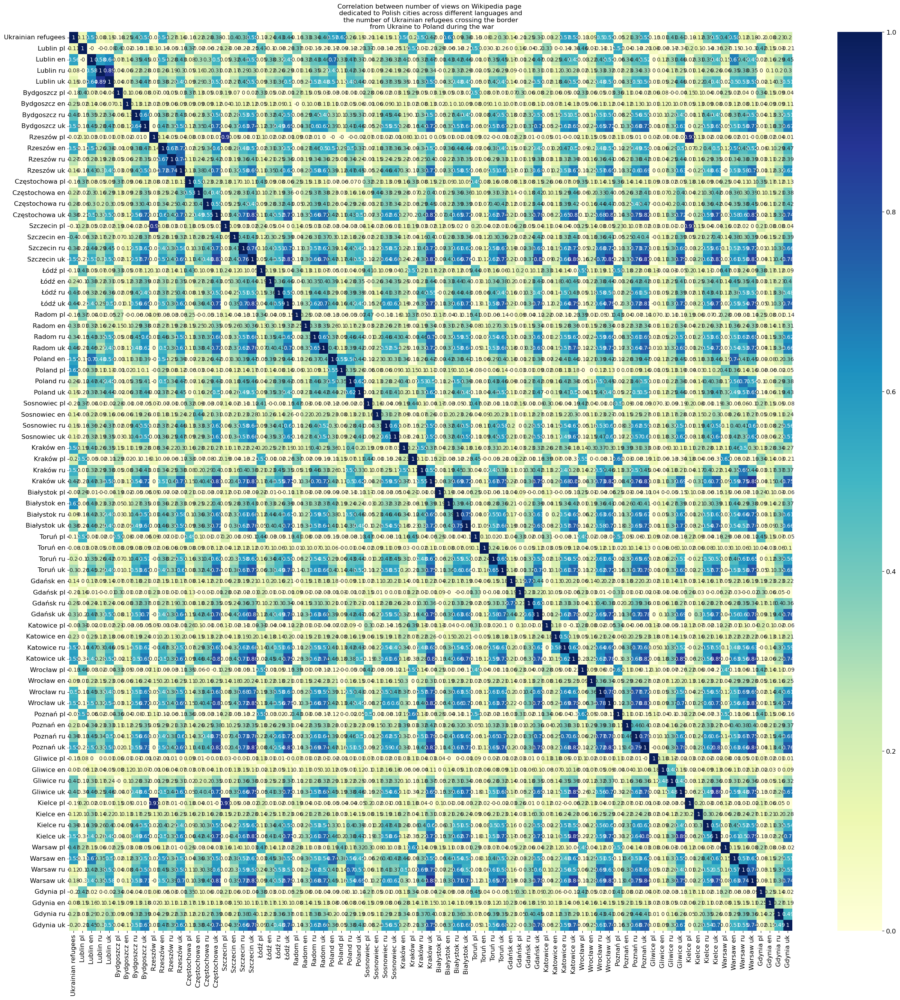

In [30]:
plt.rcParams["figure.figsize"] = (30, 30)
corr = df_merged.corr().round(2)
sns.heatmap(corr, cmap="YlGnBu", annot=True, vmin=0, vmax=1)
plt.title("Correlation between number of views on Wikipedia page \n dedicated to Polish cities across different languages and \n the number of Ukrainian refugees crossing the border \n from Ukraine to Poland during the war")
plt.savefig("figs/corr/correlations.png", format="png", bbox_inches="tight", dpi=300)
plt.show() 

C:\Users\coimbravieira\AppData\Local\Temp\ipykernel_18544\2913049888.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set(ylabel="Correlation", xlabel="English", xticklabels=["English"], xticks=[], ylim=(-0.3, 0.7))
C:\Users\coimbravieira\AppData\Local\Temp\ipykernel_18544\2913049888.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set(yticks=[], xlabel="Polish", xticklabels=["Polish"], xticks=[], ylim=(-0.3, 0.7))
C:\Users\coimbravieira\AppData\Local\Temp\ipykernel_18544\2913049888.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set(yticks=[], xlabel="Russian", xticklabels=["Russian"], xticks=[], ylim=(-0.3, 0.7))
C:\Users\coimbravieira\AppData\Local\Temp\ipykernel_18544\2913049888.py:35: UserWarning: set_tick

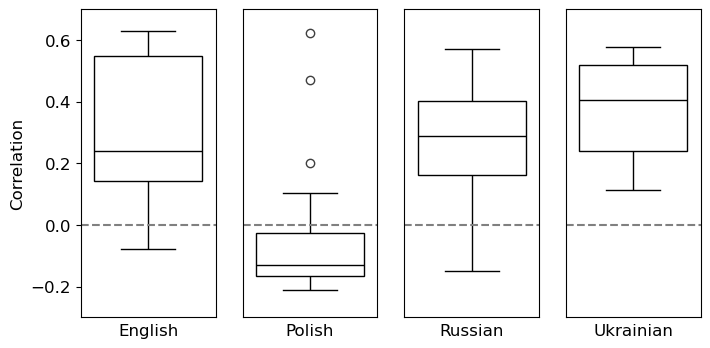

In [31]:
PROPS = {
    'boxprops':{'facecolor':'white', 'edgecolor':'black'},
    'medianprops':{'color':'black'},
    'whiskerprops':{'color':'black'},
    'capprops':{'color':'black'}
}

plt.rcParams["figure.figsize"] = (8, 4)

# Store the list of columns
suffix_columns_to_plot = ['en', 'pl', 'ru', 'uk']

# Create the figure and two subplots
fig, axes = plt.subplots(ncols=len(suffix_columns_to_plot))

# Create the boxplot with Seaborn
for c, axis in zip(suffix_columns_to_plot, axes):
           
    df_aux = df_merged[["Ukrainian refugees"] + [col for col in df_merged if c in col]]
    df_aux = df_aux.dropna()
    corrs = df_aux.corr().iloc[1:-1,0].tolist()
    sns.boxplot(data=corrs, ax=axis, **PROPS) 
    if c == 'en':
        #axis.set_title("Correlation between number of views on Wikipedia pages dedicated to \nPolish cities across different languages and the number of Ukrainian \nrefugees crossing the border from Ukraine to Poland (24.02.22-07.03.23)", 
        #              loc="left")
        axis.set(ylabel="Correlation", xlabel="English", xticklabels=["English"], xticks=[], ylim=(-0.3, 0.7))
        
    elif c == "pl":
        axis.set(yticks=[], xlabel="Polish", xticklabels=["Polish"], xticks=[], ylim=(-0.3, 0.7))
        
    elif c == "ru":
        axis.set(yticks=[], xlabel="Russian", xticklabels=["Russian"], xticks=[], ylim=(-0.3, 0.7))
        
    elif c == "uk":
        axis.set(yticks=[], xlabel="Ukrainian", xticklabels=["Ukrainian"], xticks=[], ylim=(-0.3, 0.7))
        
    axis.axhline(0, ls='--', c='gray')
    

plt.savefig("figs/corr/corr-boxplot.png", format="png", bbox_inches="tight", dpi=300)
plt.show()

In [32]:
df_merged[["Ukrainian refugees"] + [col for col in df_merged if "en" in col]].dropna().corr()

,Ukrainian refugees,Lublin en,Bydgoszcz en,Rzeszów en,Częstochowa en,Szczecin en,Łódź en,Radom en,Poland en,Sosnowiec en,...,Białystok en,Toruń en,Gdańsk en,Katowice en,Wrocław en,Poznań en,Gliwice en,Kielce en,Warsaw en,Gdynia en
Ukrainian refugees,1.000000,0.560921,0.253794,0.540578,0.221007,0.402879,0.239617,0.333131,0.565241,0.143951,...,0.629561,-0.078099,0.144151,0.227786,0.089325,0.205064,0.011231,0.120583,0.575937,0.079846
Lublin en,0.560921,1.000000,0.307319,0.475034,0.227089,0.377998,0.368219,0.340704,0.839553,0.283332,...,0.673326,0.006458,0.171912,0.320650,0.078055,0.230593,0.081916,0.113738,0.775886,0.124846
Bydgoszcz en,0.253794,0.307319,1.000000,0.240663,0.125596,0.306208,0.237183,0.164224,0.392983,0.166825,...,0.336865,0.048086,0.111724,0.370356,0.088665,0.242127,-0.042715,0.177546,0.397114,0.141187
Rzeszów en,0.540578,0.475034,0.240663,1.000000,0.153764,0.301295,0.235314,0.288212,0.478598,0.219430,...,0.491292,-0.035657,0.096887,0.184097,0.034059,0.182983,-0.009617,0.136302,0.608324,0.090844
Częstochowa en,0.221007,0.227089,0.125596,0.153764,1.000000,0.305018,0.137349,0.105804,0.151227,0.048894,...,0.212294,0.101294,0.163793,0.089837,0.108682,0.181358,-0.025235,0.067797,0.219560,0.276370
Szczecin en,0.402879,0.377998,0.306208,0.301295,0.305018,1.000000,0.284407,0.275070,0.402061,0.218119,...,0.456686,0.202781,0.243587,0.244861,0.186189,0.337103,0.029909,0.159506,0.446401,0.265851
Łódź en,0.239617,0.368219,0.237183,0.235314,0.137349,0.284407,1.000000,0.130152,0.377376,0.140290,...,0.312202,0.025091,0.114234,0.083046,0.082703,0.150718,0.003648,0.029568,0.381761,0.140885
Radom en,0.333131,0.340704,0.164224,0.288212,0.105804,0.275070,0.130152,1.000000,0.300181,0.197585,...,0.376024,0.048956,0.120173,0.168087,0.023547,0.101031,0.010230,0.041141,0.358622,0.089225
Poland en,0.565241,0.839553,0.392983,0.478598,0.151227,0.402061,0.377376,0.300181,1.000000,0.274935,...,0.704166,-0.030582,0.187694,0.377001,0.165661,0.279787,0.122004,0.128441,0.830285,0.037280
Sosnowiec en,0.143951,0.283332,0.166825,0.219430,0.048894,0.218119,0.140290,0.197585,0.274935,1.000000,...,0.222478,0.016275,0.062442,0.159293,0.001806,0.178706,0.016421,0.109475,0.311699,0.121170


In [33]:
df_merged[["Ukrainian refugees"] + [col for col in df_merged if "en" in col]].dropna().corr().iloc[1:-1,0].tolist()

[0.5609212966465293,
 0.25379393343620893,
 0.5405776928726572,
 0.2210069979746334,
 0.4028789077114911,
 0.23961661425426198,
 0.3331305831024702,
 0.5652409466359055,
 0.143950519408975,
 0.5596370234830932,
 0.6295610362844486,
 -0.07809851924420294,
 0.14415053207924555,
 0.22778581058377034,
 0.08932514442724208,
 0.20506442151147924,
 0.011231294356152964,
 0.12058311222736537,
 0.5759373789386805]

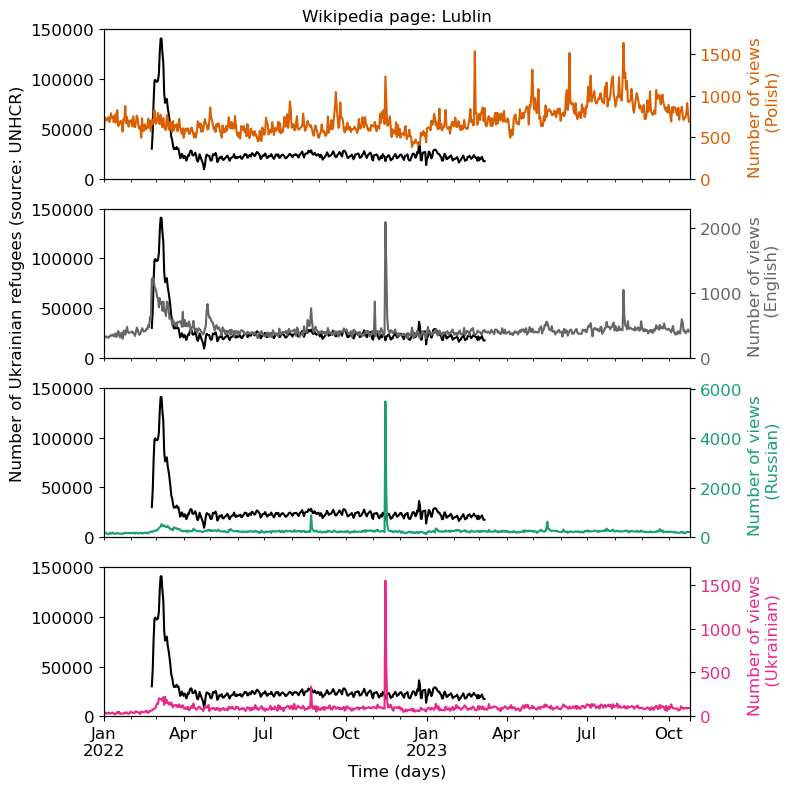

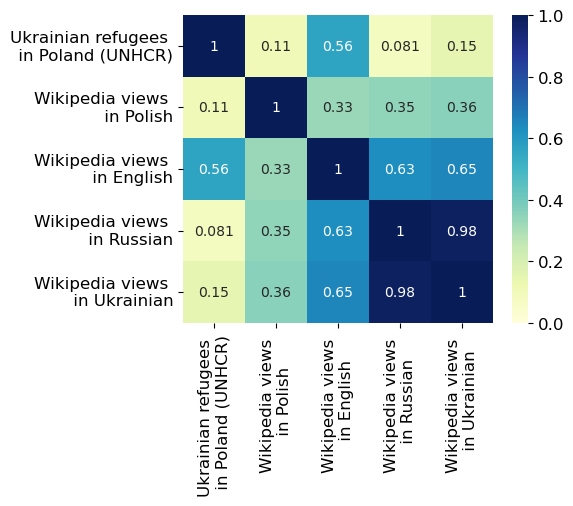

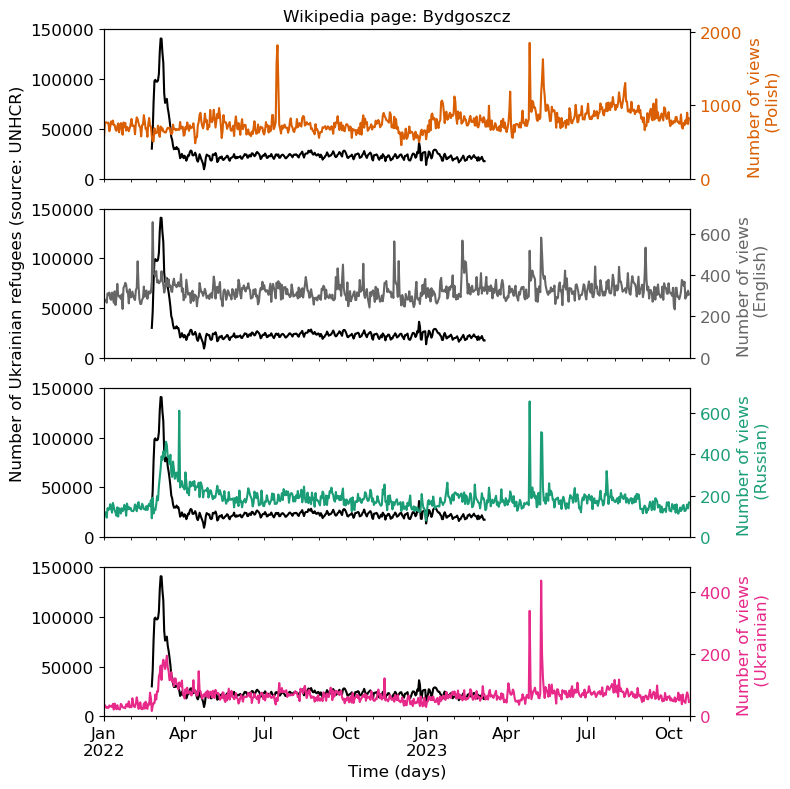

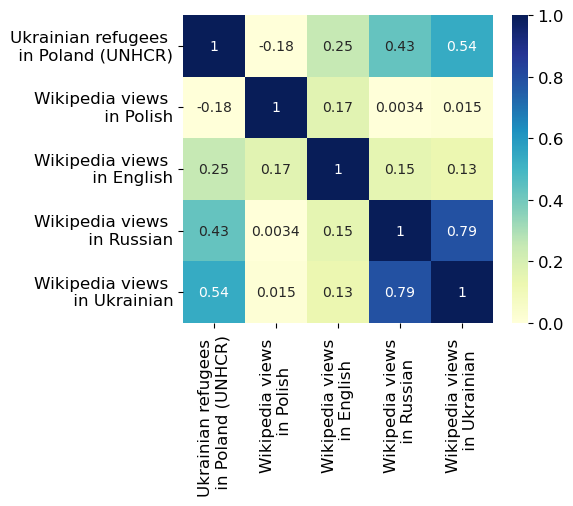

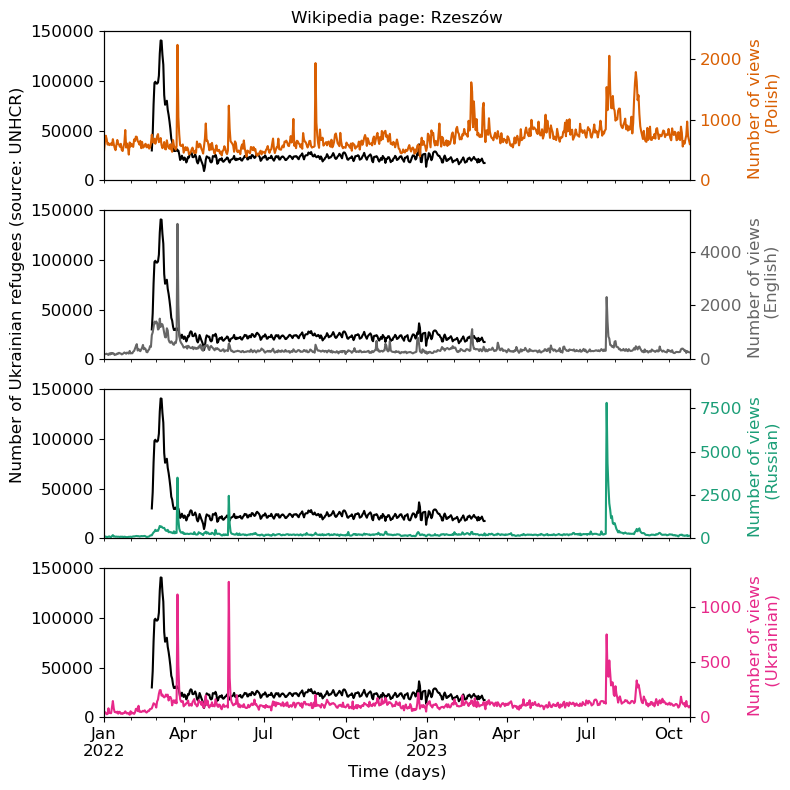

...

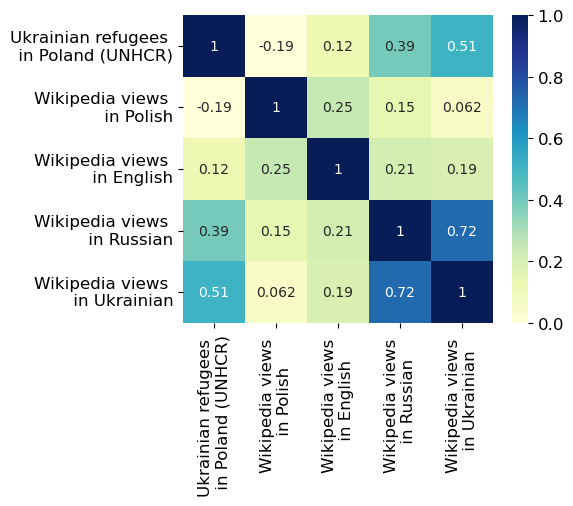

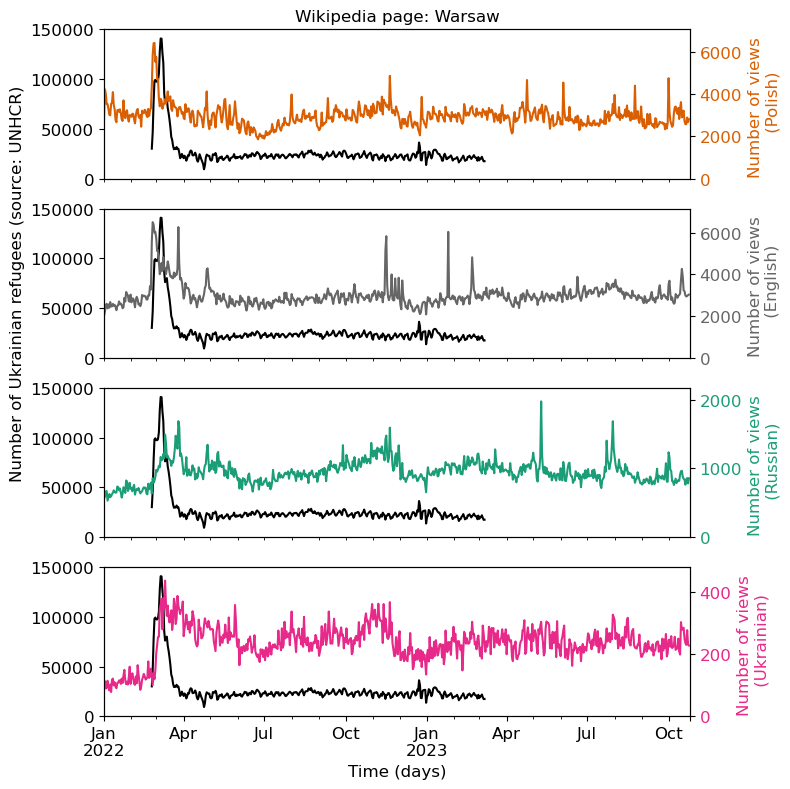

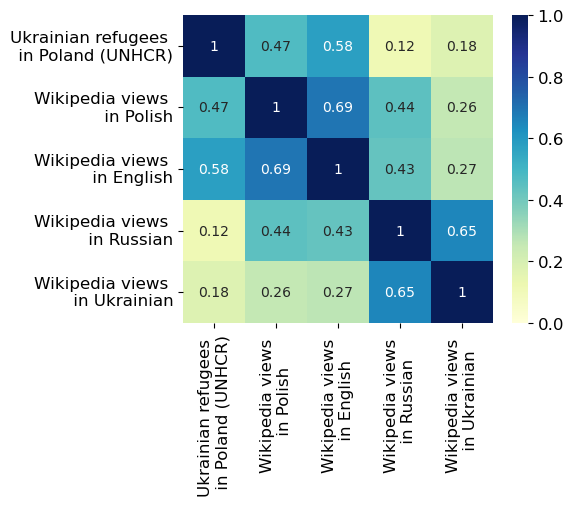

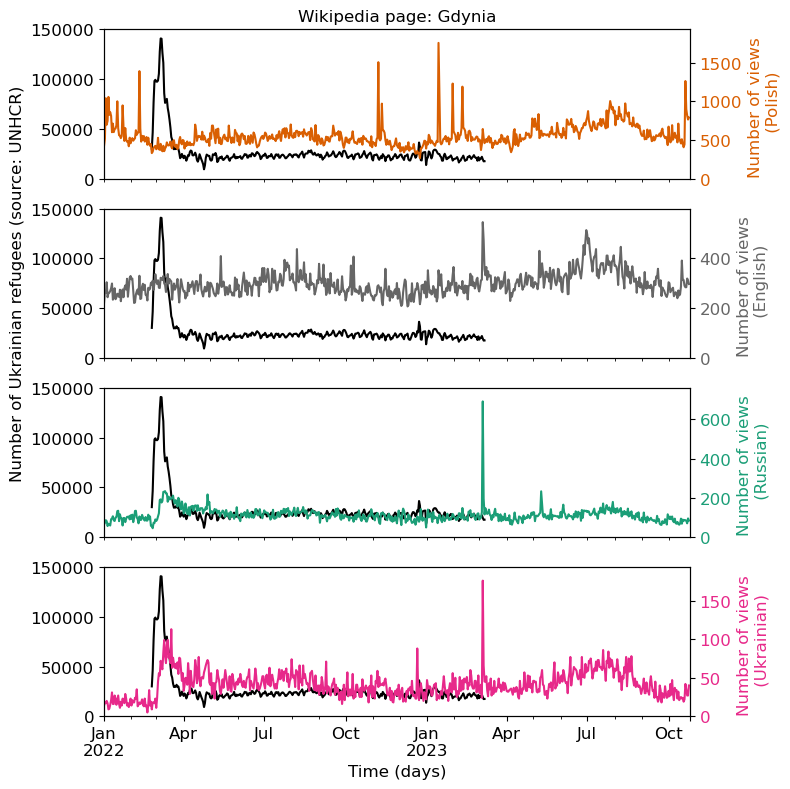

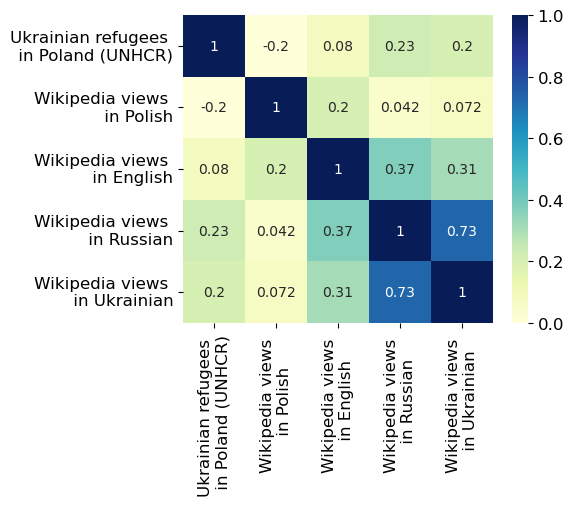

In [34]:
for f in csv_files_preprocess:
    
    plt.rcParams["figure.figsize"] = (8, 8)
    
    city = f.split("\\")[-1].split(".")[0]
    
    filter_col = ["Ukrainian refugees"] + [col for col in df_merged if col.startswith(city)]
    
    df = df_merged[filter_col]
    df.columns = [c.split(" ")[1] if city in c else c for c in df.columns]

    df_plot = df_merged[filter_col]
    df_plot.columns = [c.split(" ")[1] if city in c else c for c in df.columns]
    
    ## DF PLOT!!! RANGE
    df_plot = df_plot["2022-01-01":]
    
    # LOG ALL VALUES or NORM MAX 
    #df_plot = (np.log(df_plot)).replace(-np.inf, 0)
    #df_plot = df_plot / df_plot.max()
    #df_plot = df_plot / df_plot.sum()
      
    
    fig, axes1 = plt.subplots(4, 1)
    
    df_plot[["Ukrainian refugees"]].plot.line(
        ax=axes1[0], color=colors_langs_dict, title="Wikipedia page: " + city, ylim=(0, 150000), legend=None)
    df_plot[["Ukrainian refugees"]].plot.line(
        ax=axes1[1], color=colors_langs_dict, ylim=(0, 150000), legend=None)
    df_plot[["Ukrainian refugees"]].plot.line(
        ax=axes1[2], color=colors_langs_dict, ylim=(0, 150000), legend=None)
    df_plot[["Ukrainian refugees"]].plot.line(
        ax=axes1[3], color=colors_langs_dict, ylim=(0, 150000), legend=None)
    
    axes1[3].set_xlabel('Time (days)')
    axes1[1].set_ylabel('Number of Ukrainian refugees (source: UNHCR)', color=colors_langs_dict["Ukrainian refugees"])
    
    axes20 = axes1[0].twinx()  # instantiate a second axes that shares the same x-axis
    axes21 = axes1[1].twinx()  # instantiate a second axes that shares the same x-axis
    axes22 = axes1[2].twinx()  # instantiate a second axes that shares the same x-axis
    axes23 = axes1[3].twinx()  # instantiate a second axes that shares the same x-axis
    
    df_plot[["pl"]].plot.line(
        ax=axes20, color=colors_langs_dict, xticks=[], ylim=(0, df_plot["pl"].max()*1.1), legend=None)
    axes20.set_ylabel('Number of views \n (Polish)', color=colors_langs_dict["pl"])
    axes20.tick_params(axis='y', labelcolor=colors_langs_dict["pl"])
    
    df_plot[["en"]].plot.line(
        ax=axes21, color=colors_langs_dict, xticks=[], ylim=(0, df_plot["en"].max()*1.1), legend=None)
    axes21.set_ylabel('Number of views \n (English)', color=colors_langs_dict["en"])
    axes21.tick_params(axis='y', labelcolor=colors_langs_dict["en"])
    
    df_plot[["ru"]].plot.line(
        ax=axes22, color=colors_langs_dict, xticks=[], ylim=(0, df_plot["ru"].max()*1.1), legend=None)
    axes22.set_ylabel('Number of views \n (Russian)', color=colors_langs_dict["ru"])
    axes22.tick_params(axis='y', labelcolor=colors_langs_dict["ru"])
    
    df_plot[["uk"]].plot.line(
        ax=axes23, color=colors_langs_dict, ylim=(0, df_plot["uk"].max()*1.1), legend=None)
    axes23.set_ylabel('Number of views \n (Ukrainian)', color=colors_langs_dict["uk"])
    axes23.tick_params(axis='y', labelcolor=colors_langs_dict["uk"])
    
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.savefig("figs/series/plot" + city + ".png", format="png", bbox_inches="tight", dpi=300)
    plt.show()
    
    
    plt.rcParams["figure.figsize"] = (5, 4)
    df_plot.rename(columns={"Ukrainian refugees": "Ukrainian refugees \n in Poland (UNHCR)", 
                       "pl": "Wikipedia views \n in Polish", 
                       "en": "Wikipedia views \n in English", 
                       "ru": "Wikipedia views \n in Russian", 
                       "uk": "Wikipedia views \n in Ukrainian"}, inplace=True)
    
    corr = df_plot.dropna().corr()
    sns.heatmap(corr, cmap="YlGnBu", annot=True, vmin=0, vmax=1)
    #plt.title(city + ": Correlation between number of views on Wikipedia page \n dedicated to " + city + " across different languages and \n the number of Ukrainian refugees crossing the border \n from Ukraine to Poland (24.02.22-07.03.23)")
    plt.savefig("figs/corr/corr-" + city + ".png", format="png", bbox_inches="tight", dpi=300)
    plt.show()

### Granger causality

The Null hypothesis for grangercausalitytests is that the time series in the second column, x2, does NOT Granger cause the time series in the first column, x1. Grange causality means that past values of x2 have a statistically significant effect on the current value of x1, taking past values of x1 into account as regressors. We reject the null hypothesis that x2 does not Granger cause x1 if the pvalues are below a desired size of the test.

https://www.machinelearningplus.com/time-series/granger-causality-test-in-python/


The Granger Causality test is used to determine whether or not one time series is useful for forecasting another.

This test uses the following null and alternative hypotheses:

Null Hypothesis (H0): Time series x does not Granger-cause time series y

Alternative Hypothesis (HA): Time series x Granger-causes time series y

The term “Granger-causes” means that knowing the value of time series x at a certain lag is useful for predicting the value of time series y at a later time period.

This test produces an F test statistic with a corresponding p-value. If the p-value is less than a certain significance level (i.e. α = .05), then we can reject the null hypothesis and conclude that we have sufficient evidence to say that time series x Granger-causes time series y.

https://www.statology.org/granger-causality-test-in-python/


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

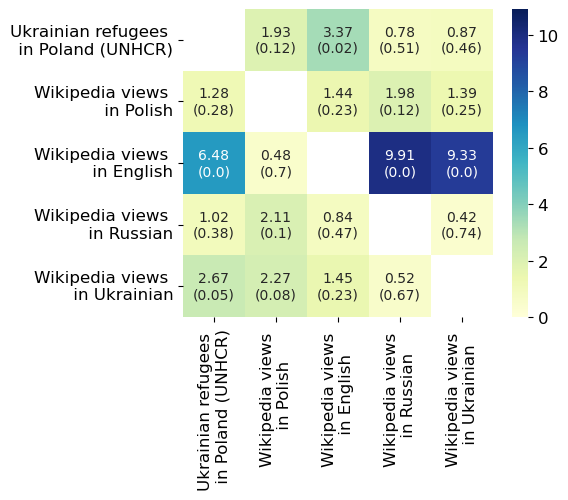

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

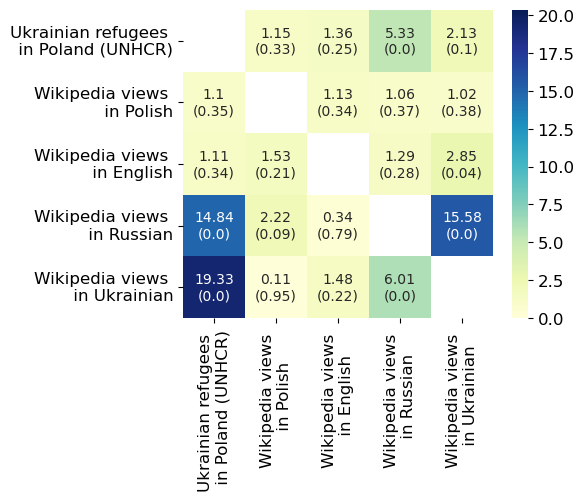

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

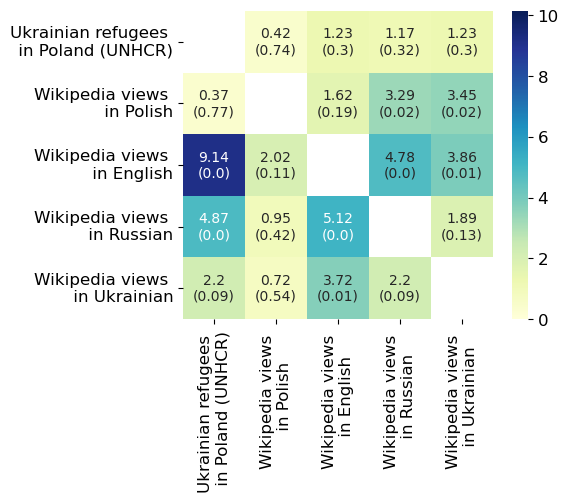

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

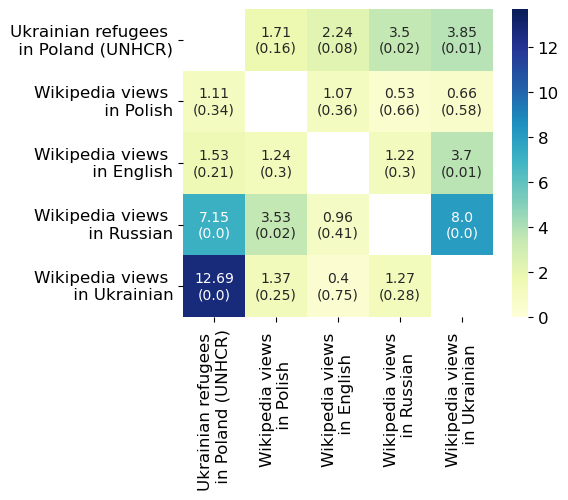

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

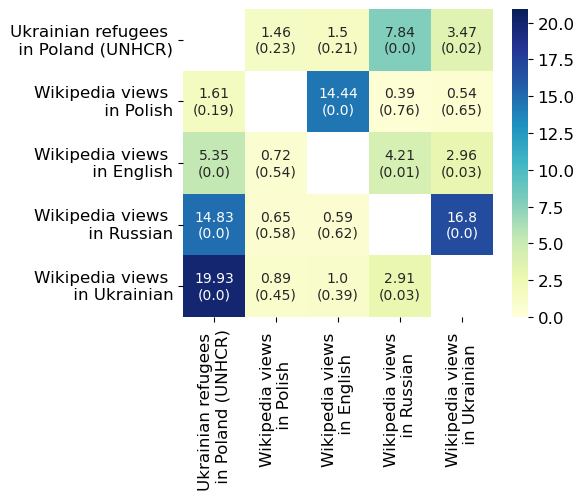

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

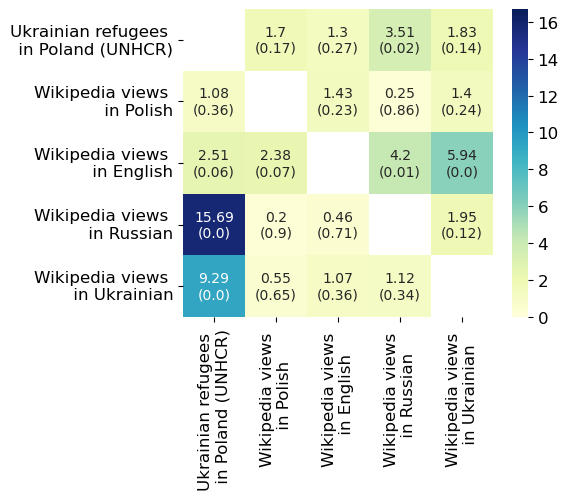

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

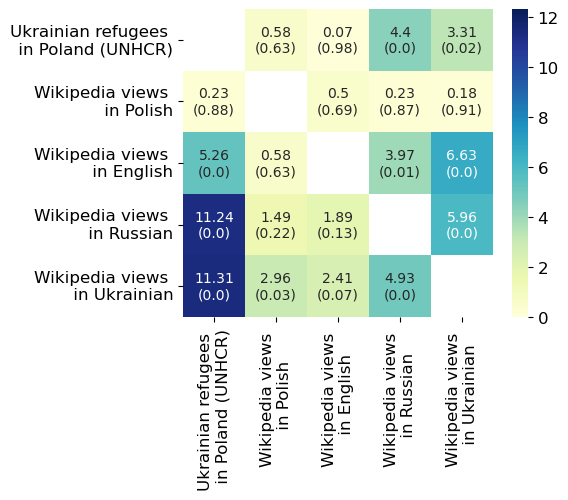

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

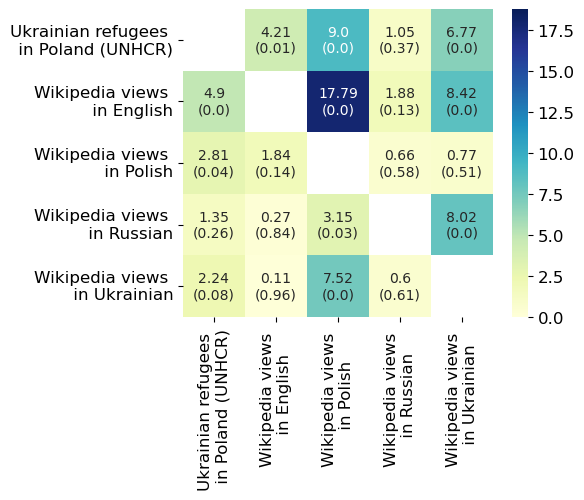

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

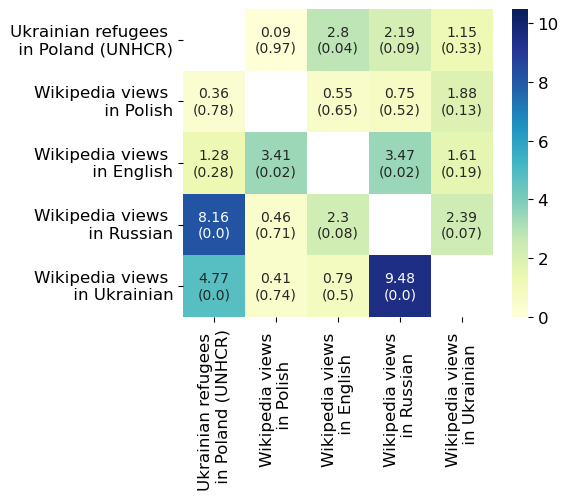

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

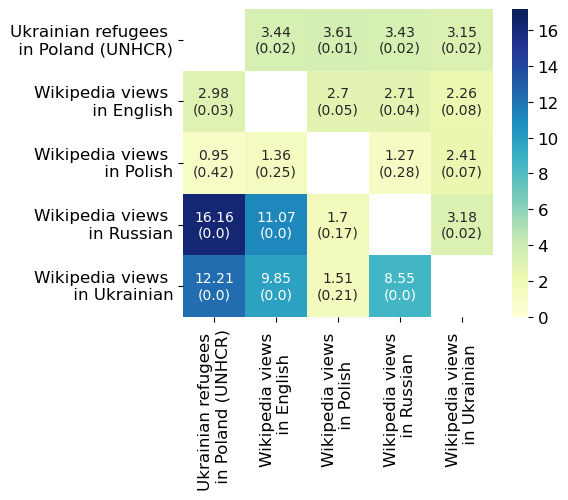

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

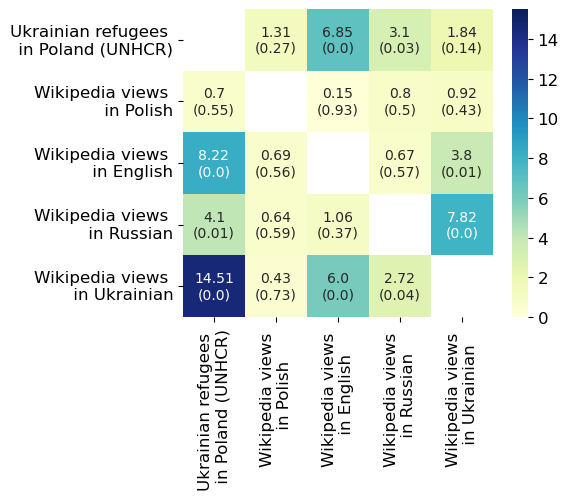

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

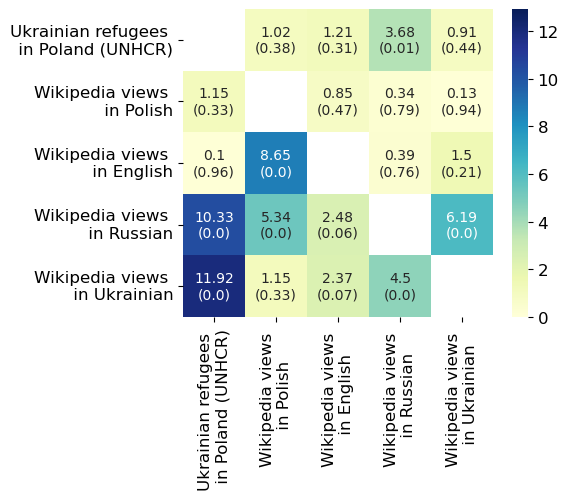

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

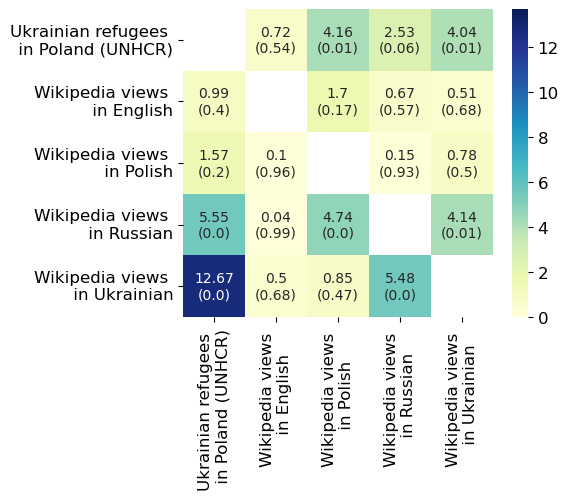

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

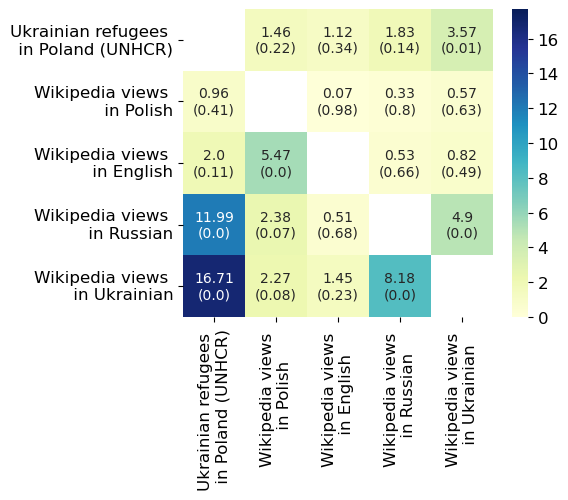

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

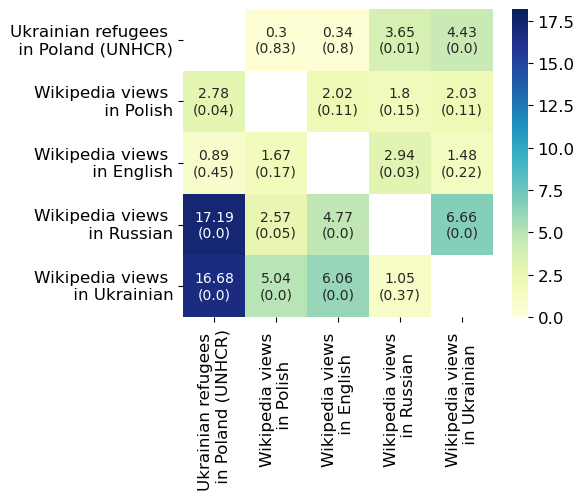

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

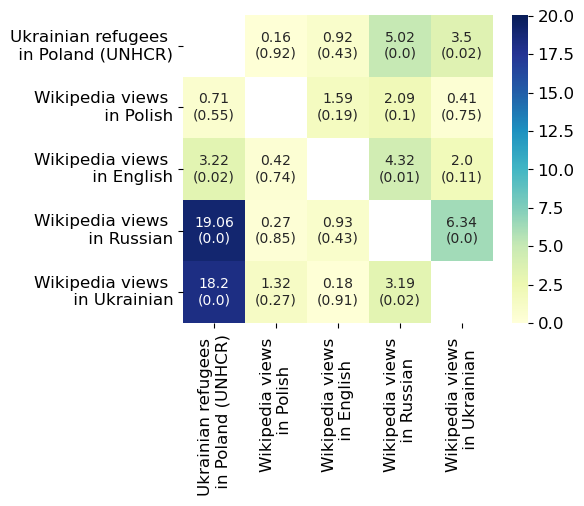

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

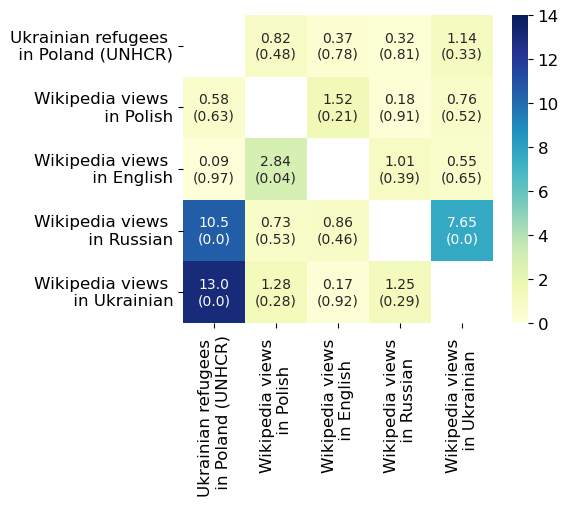

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

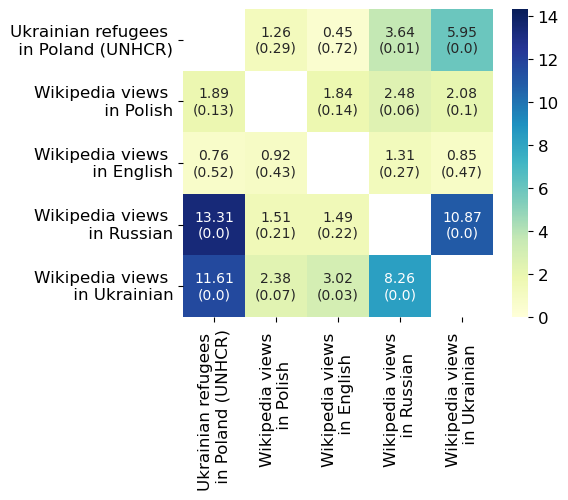

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

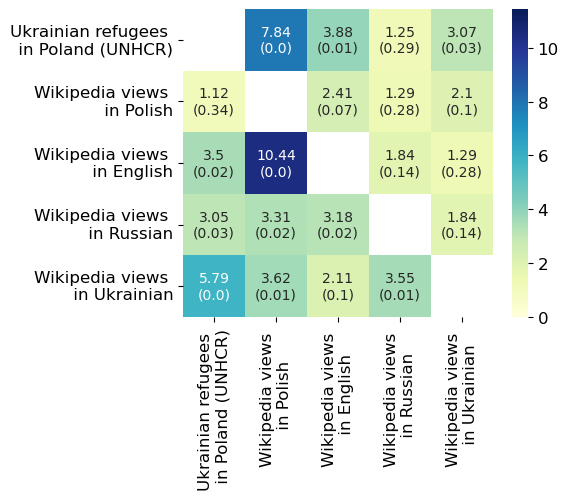

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions shou

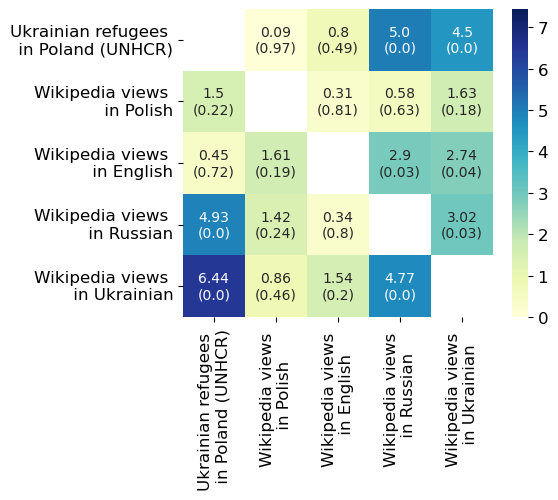

In [35]:
for f in csv_files_preprocess:
    
    plt.rcParams["figure.figsize"] = (5, 4)
    
    city = f.split("\\")[-1].split(".")[0]
    
    filter_col = ["Ukrainian refugees"] + [col for col in df_merged if col.startswith(city)]
    
    df = df_merged[filter_col]
    df.columns = [c.split(" ")[1] if city in c else c for c in df.columns]
   
    ## WAR PERIOD
    df = df["2022-02-24":"2023-03-07"]    
    
    df.rename(columns={"Ukrainian refugees": "Ukrainian refugees \n in Poland (UNHCR)", 
                       "pl": "Wikipedia views \n in Polish", 
                       "en": "Wikipedia views \n in English", 
                       "ru": "Wikipedia views \n in Russian", 
                       "uk": "Wikipedia views \n in Ukrainian"}, inplace=True)
    
    df_dot_f = df.T.dot(df)
    labels = df.T.dot(df)
    
    for r in df_dot_f.index:
        for c in df_dot_f.columns:
            df_dot_f.loc[r,c] = np.nan
            labels.loc[r,c] = ""
            
            if r != c:
                g_causality = grangercausalitytests(df[[r,c]], maxlag=[3], verbose=False)[3][0]["params_ftest"]
                
                fscore = g_causality[0]
                pvalue = g_causality[1]
                
                df_dot_f.loc[r,c] = fscore
                labels.loc[r,c] = str(round(fscore,2)) + "\n(" + str(round(pvalue, 2)) + ")" # 0 -> F, 1 -> p-value
                

    sns.heatmap(df_dot_f, cmap="YlGnBu", annot=labels, fmt = '', vmin=0, vmax=max(df_dot_f.max())+1)
    #plt.title(city + ": F-test for Granger causality (column Granger cause row)\n(24.02.22-07.03.23)")
    plt.savefig("figs/granger/granger-f-" + city + ".png", format="png", bbox_inches="tight", dpi=300)
    plt.show()
